# MediSina Scan --- MobileViT-XS vs MobileNetV2: Comparative Drug Image Classification

**Thesis Project | Lightweight On-Device Pharmaceutical Image Classifier**

This single notebook trains and evaluates **both** models end to end through one identical pipeline: the same dataset, the same 70/15/15 stratified split, the same preprocessing and augmentation, the same two-phase training schedule, the same evaluation protocol, and the same Grad-CAM analysis. Every model-specific step is a function called once per model from a single loop, so the comparison is fair by construction — there is only one copy of the shared code.

**Models:** MobileViT-XS (Mehta & Rastegari, 2021) and MobileNetV2 (Sandler et al., 2018)

**Workflow:** shared setup → EDA → augmentation → split → `for spec in MODEL_SPECS:` (train → evaluate → Grad-CAM → export) → side-by-side comparison.


## Section 0. Package Installation and Library Imports

In [1]:
# Install pinned third-party packages for reproducibility.
# NOTE: pin these to the exact versions used for your reported run. The values below are
# indicative recent-stable versions; albumentations is pinned because its augmentation API
# operation availability/behaviour changes between minor releases.
!pip install -q timm==1.0.11 einops==0.8.0 onnx==1.16.2 onnxruntime==1.18.1
!pip install -q albumentations==1.4.18
!pip install -q torchinfo==1.8.0 tabulate==0.9.0  # tabulate -> pandas .to_markdown()

print('Pinned packages installed.')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.4/48.4 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 63.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 57.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 76.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 65.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 80.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 6.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.39.0 requires google-cloud-b

In [2]:
# Record the exact environment for reproducibility (logged with the run).
import sys, platform, torch, timm, albumentations as _alb, numpy as _np
print('Python      :', sys.version.split()[0], '|', platform.platform())
print('torch       :', torch.__version__, '| CUDA:', torch.version.cuda)
print('timm        :', timm.__version__)
print('albumentations:', _alb.__version__)
print('numpy       :', _np.__version__)
print('GPU         :', torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU only')

Python      : 3.12.13 | Linux-6.12.90+-x86_64-with-glibc2.35
torch       : 2.10.0+cu128 | CUDA: 12.8
timm        : 1.0.11
albumentations: 1.4.18
numpy       : 2.4.6
GPU         : Tesla T4


/usr/local/lib/python3.12/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.8 (you have 1.4.18). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [3]:
# ── Standard Library and Numerical Computing ───────────────────────────────
import os
import json
import time
import random
import shutil
import numpy as np
import pandas as pd
from pathlib import Path
from collections import Counter

# ── PyTorch: Deep Learning Framework ──────────────────────────────────────
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchinfo import summary

# ── timm: PyTorch Image Models — provides pretrained MobileNetV2 ──────────
import timm

# ── Albumentations: image augmentation pipeline ─────────────────────────────
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
from PIL import Image, ImageEnhance

# ── Evaluation Metrics and Visualisation ──────────────────────────────────
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_recall_fscore_support
)
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

print('All imports successful.')
print(f'PyTorch version : {torch.__version__}')
print(f'CUDA available  : {torch.cuda.is_available()}')
# ── Print-readable plot defaults (large fonts for the thesis) ─────────────
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams.update({
    "font.size": 16, "axes.titlesize": 20, "axes.titleweight": "bold",
    "axes.labelsize": 18, "xtick.labelsize": 14, "ytick.labelsize": 14,
    "legend.fontsize": 14, "figure.titlesize": 24, "figure.titleweight": "bold",
    "savefig.dpi": 150,
})


All imports successful.
PyTorch version : 2.10.0+cu128
CUDA available  : True


------------------------------------------------------------------------

## Section 1. Reproducibility, Paths, and Configuration

In [4]:
# ── Global Reproducibility Seed and Deterministic Execution ───────────────
# A single seed plus deterministic algorithms make dataset splits, weight
# initialisation, and augmentation sampling reproducible across runs.
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'
# warn_only=True: some GPU kernels lack deterministic implementations; warn instead
# of erroring so the notebook still runs end-to-end.
torch.use_deterministic_algorithms(True, warn_only=True)

# Seeded DataLoader workers (keeps augmentation sampling reproducible across workers).
def seed_worker(worker_id):
    worker_seed = SEED + worker_id
    np.random.seed(worker_seed)
    random.seed(worker_seed)

loader_generator = torch.Generator()
loader_generator.manual_seed(SEED)

# ── Dataset and Output Directory Paths ────────────────────────────────────
TRAIN_DIR        = Path('/kaggle/input/datasets/vencerlanz09/pharmaceutical-drugs-and-vitamins-synthetic-images/Drug Vision/Data Combined')
FLUOR_TEST_DIR   = Path('/kaggle/input/datasets/ncvaog/pills-dataset-test/Pill_tests/Fluorescent_light')
NATURAL_TEST_DIR = Path('/kaggle/input/datasets/ncvaog/pills-dataset-test/Pill_tests/Natural_light')
OUTPUT_DIR = Path('/kaggle/working/medisina_output')
LOG_PATH   = OUTPUT_DIR / 'train_log.json'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# ── Hyperparameter Configuration ──────────────────────────────────────────
CFG = {
    'img_size'        : 256,
    'batch_size'      : 32,
    'num_workers'     : 2,
    'num_classes'     : 10,
    'epochs'          : 100,        # Phase-2 max epochs (thesis Table 6)
    'lr'              : 3e-4,
    'weight_decay'    : 1e-4,
    'train_split'     : 0.70,       # used in the split-sum assertion below
    'val_split'       : 0.15,
    'synth_test_split': 0.15,
    'label_smooth'    : 0.1,
    'patience'        : 10,         # early-stopping patience (thesis Table 6)
    'device'          : 'cuda' if torch.cuda.is_available() else 'cpu',
}

# Strict split enforcement: the three fractions must sum to 1.0.
assert abs(CFG['train_split'] + CFG['val_split'] + CFG['synth_test_split'] - 1.0) < 1e-9, \
    'Split fractions must sum to 1.0'

# ── Class Label List (alphabetical = filesystem folder order) ─────────────
CLASS_NAMES = sorted([
    'Alaxan', 'Bactidol', 'Bioflu', 'Biogesic', 'DayZinc',
    'Decolgen', 'Fish Oil', 'Kremil S', 'Medicol', 'Neozep'
])


print('Configuration set.')
print(f'Device      : {CFG["device"]}')
print(f'Image Size  : {CFG["img_size"]}x{CFG["img_size"]}')
print(f'Split       : {int(CFG["train_split"]*100)}/{int(CFG["val_split"]*100)}/{int(CFG["synth_test_split"]*100)} (train/val/synth-test)')
print(f'Classes     : {CLASS_NAMES}')

Configuration set.
Device      : cuda
Image Size  : 256x256
Split       : 70/15/15 (train/val/synth-test)
Classes     : ['Alaxan', 'Bactidol', 'Bioflu', 'Biogesic', 'DayZinc', 'Decolgen', 'Fish Oil', 'Kremil S', 'Medicol', 'Neozep']


In [5]:
# ── Model Registry: the two architectures compared in this study ───────────
# Every model-specific path, label, and timm tag lives here. The pipeline below
# loops over this list, so adding or swapping a model changes nothing else.
MODEL_SPECS = [
    {
        "key"        : "mobilevit_xs",
        "label"      : "MobileViT-XS",
        "timm_tag"   : "mobilevit_xs.cvnets_in1k",
        "gradcam_layer": "auto",   # last conv block auto-detected
    },
    {
        "key"        : "mobilenetv2",
        "label"      : "MobileNetV2",
        "timm_tag"   : "mobilenetv2_100.ra_in1k",
        "gradcam_layer": "conv_head",
    },
]

def spec_paths(spec):
    """Per-model output paths (checkpoints, onnx, tflite)."""
    stem = spec["key"]
    return {
        "phase1_ckpt": OUTPUT_DIR / f"phase1_best_{stem}.pth",
        "best_ckpt"  : OUTPUT_DIR / f"best_{stem}.pth",
        "onnx"       : OUTPUT_DIR / f"{stem}.onnx",
        "tf_dir"     : OUTPUT_DIR / f"{stem}_tf",
        "tflite"     : OUTPUT_DIR / f"{stem}.tflite",
    }

print(f"{len(MODEL_SPECS)} models registered: " + ", ".join(s["label"] for s in MODEL_SPECS))


2 models registered: MobileViT-XS, MobileNetV2


In [6]:
# ── Session State Manager ──────────────────────────────────────────────────
# Persists completed section names and metadata to session_state.json so that
# long-running sections (EDA, training) can be skipped on notebook restart.
#
# Usage:
#   is_section_done("eda")                      -> bool
#   mark_section_complete("training", {...})     -> writes to JSON
#   load_session_state()                         -> dict
#   backup_to_kaggle_dataset("user/slug")        -> pushes OUTPUT_DIR to Kaggle

_STATE_PATH = OUTPUT_DIR / "session_state.json"

def load_session_state():
    """Load and return the full session state dict."""
    if _STATE_PATH.exists():
        with open(_STATE_PATH) as _f:
            return json.load(_f)
    return {"completed_sections": []}

def _save_session_state(state):
    with open(_STATE_PATH, "w") as _f:
        json.dump(state, _f, indent=2)

def is_section_done(section_name):
    """Return True if section_name has been marked complete in this session."""
    return section_name in load_session_state().get("completed_sections", [])

def mark_section_complete(section_name, metadata=None):
    """Mark a section as complete and optionally store metadata."""
    state = load_session_state()
    if section_name not in state["completed_sections"]:
        state["completed_sections"].append(section_name)
    if metadata:
        state.setdefault("metadata", {})[section_name] = metadata
    _save_session_state(state)
    print(f"  Section '{section_name}' marked complete.")

def backup_to_kaggle_dataset(slug):
    """Push OUTPUT_DIR contents to a private Kaggle dataset."""
    if not slug:
        print("KAGGLE_DATASET_SLUG is not set. Skipping backup.")
        print("Set it to e.g. \"your-username/medisina-output\" and re-run.")
        return
    import subprocess
    result = subprocess.run(
        ["kaggle", "datasets", "version", "-p", str(OUTPUT_DIR),
         "-m", "Auto-backup from notebook", "--dir-mode", "zip"],
        capture_output=True, text=True
    )
    if result.returncode == 0:
        print(f"Backup pushed to Kaggle dataset: {slug}")
        print(result.stdout)
    else:
        print("Backup failed:", result.stderr)

print(" Session state manager defined.")
print(f"  State file: {_STATE_PATH}")
if _STATE_PATH.exists():
    _s = load_session_state()
    print(f"  Completed sections: {_s.get('completed_sections', [])}")
else:
    print("  No prior session state found — starting fresh.")

 Session state manager defined.
  State file: /kaggle/working/medisina_output/session_state.json
  No prior session state found — starting fresh.


------------------------------------------------------------------------

## Section 2. Exploratory Data Analysis (shared)

### EDA Session Guard

If the EDA section has already been executed in a previous session, the
output PNG files will already exist in `OUTPUT_DIR`. The guard cell
below detects this condition and skips re-computation, printing a file
summary instead. To force a full re-run, remove `"eda"` from
`completed_sections` in `session_state.json`.

In [7]:
# ── EDA Session Guard ──────────────────────────────────────────────────
# Checks whether EDA outputs already exist from a prior session.
# If so, computation is skipped to avoid redundant processing time.
_EDA_FILES = [
    OUTPUT_DIR / "class_distribution.png",
    OUTPUT_DIR / "sample_train_images.png",
    OUTPUT_DIR / "sample_test_images.png",
]
if is_section_done("eda") and all(p.exists() for p in _EDA_FILES):
    print('EDA was completed in a prior session. Skipping re-computation.')
    for p in _EDA_FILES:
        print(f"  {p.name}  ({p.stat().st_size/1024:.1f} KB)")
    print("To force re-run: remove 'eda' from session_state.json completed_sections")
    _SKIP_EDA = True
else:
    _SKIP_EDA = False
    print('Running Exploratory Data Analysis...')

Running Exploratory Data Analysis...


In [8]:
# ── Image Count per Class ──────────────────────────────────────────────
# Tallies images for each class in the synthetic training set and
# each of the two real-world test condition subsets.
train_counts = {}
for cls in CLASS_NAMES:
    cls_path = TRAIN_DIR / cls
    if cls_path.exists():
        count = len(list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png')))
        train_counts[cls] = count
    else:
        print(f'  Folder not found: {cls_path}')

def count_test_set(root):
    counts = {}
    for cls in CLASS_NAMES:
        cls_path = root / cls
        if cls_path.exists():
            counts[cls] = len(list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png')))
        else:
            counts[cls] = 0
    return counts

fluor_counts   = count_test_set(FLUOR_TEST_DIR)
natural_counts = count_test_set(NATURAL_TEST_DIR)

print('=== TRAINING DATASET (Synthetic) ===')
for k, v in train_counts.items():
    print(f'  {k:<15} {v} images')
print(f'  {"TOTAL":<15} {sum(train_counts.values())} images')

for label, counts in [('FLUORESCENT',   fluor_counts),
                      ('NATURAL LIGHT', natural_counts)]:
    print(f'\n=== REAL-WORLD TEST — {label} ===')
    for k, v in counts.items():
        print(f'  {k:<15} {v} images')
    print(f'  {"TOTAL":<15} {sum(counts.values())} images')

=== TRAINING DATASET (Synthetic) ===
  Alaxan          1000 images
  Bactidol        1000 images
  Bioflu          1000 images
  Biogesic        1000 images
  DayZinc         1000 images
  Decolgen        1000 images
  Fish Oil        1000 images
  Kremil S        1000 images
  Medicol         1000 images
  Neozep          1000 images
  TOTAL           10000 images

=== REAL-WORLD TEST — FLUORESCENT ===
  Alaxan          15 images
  Bactidol        15 images
  Bioflu          15 images
  Biogesic        15 images
  DayZinc         15 images
  Decolgen        15 images
  Fish Oil        15 images
  Kremil S        15 images
  Medicol         15 images
  Neozep          15 images
  TOTAL           150 images

=== REAL-WORLD TEST — NATURAL LIGHT ===
  Alaxan          15 images
  Bactidol        15 images
  Bioflu          15 images
  Biogesic        15 images
  DayZinc         15 images
  Decolgen        15 images
  Fish Oil        15 images
  Kremil S        15 images
  Medicol         1

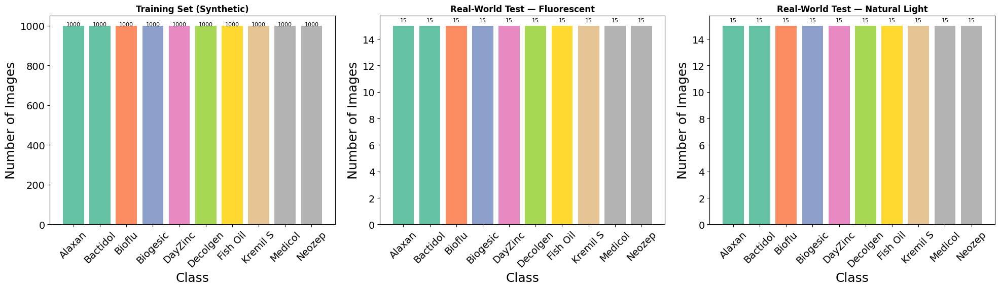

Class distribution charts saved.


In [9]:
# ── Class Distribution Visualisation ──────────────────────────────────
# Generates bar charts for training set and both real-world test subsets.
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
axes = axes.flatten()
colors = plt.cm.Set2(np.linspace(0, 1, 10))

datasets = [
    (train_counts,   'Training Set (Synthetic)',       axes[0]),
    (fluor_counts,   'Real-World Test — Fluorescent',  axes[1]),
    (natural_counts, 'Real-World Test — Natural Light', axes[2]),
]

for counts, title, ax in datasets:
    ax.bar(counts.keys(), counts.values(), color=colors)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xlabel('Class')
    ax.set_ylabel('Number of Images')
    ax.tick_params(axis='x', rotation=45)
    for i, (k, v) in enumerate(counts.items()):
        ax.text(i, v + 0.3, str(v), ha='center', fontsize=8)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'class_distribution.png', dpi=150)
plt.show()
print('Class distribution charts saved.')

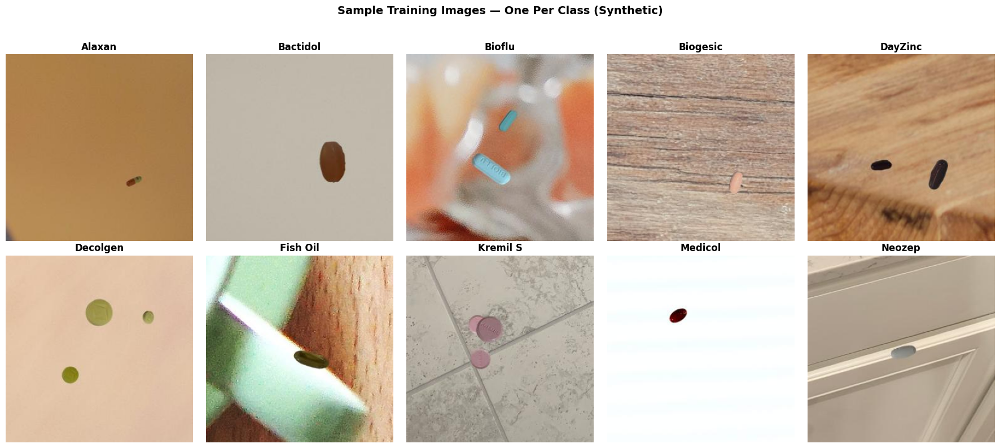

 Sample training images saved.


In [10]:
# ── Representative Sample Images (Synthetic Training Set) ─────────────
# Displays one randomly selected image per class from the training set
# for visual inspection of image quality and class appearance.
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
axes = axes.flatten()

for idx, cls in enumerate(CLASS_NAMES):
    cls_path = TRAIN_DIR / cls
    img_files = list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png'))
    if img_files:
        img = Image.open(random.choice(img_files)).convert('RGB')
        axes[idx].imshow(img)
        axes[idx].set_title(cls, fontsize=12, fontweight='bold')
        axes[idx].axis('off')

plt.suptitle('Sample Training Images — One Per Class (Synthetic)', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'sample_train_images.png', dpi=150, bbox_inches='tight')
plt.show()
print(' Sample training images saved.')

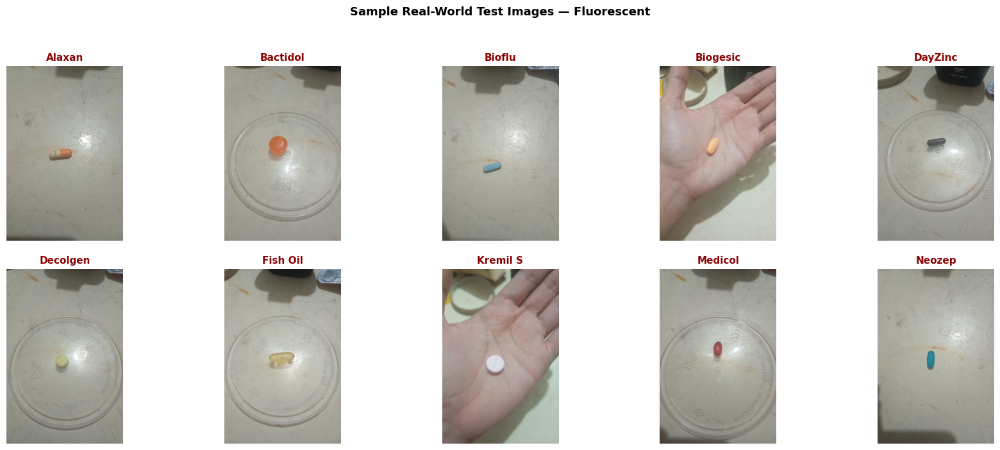

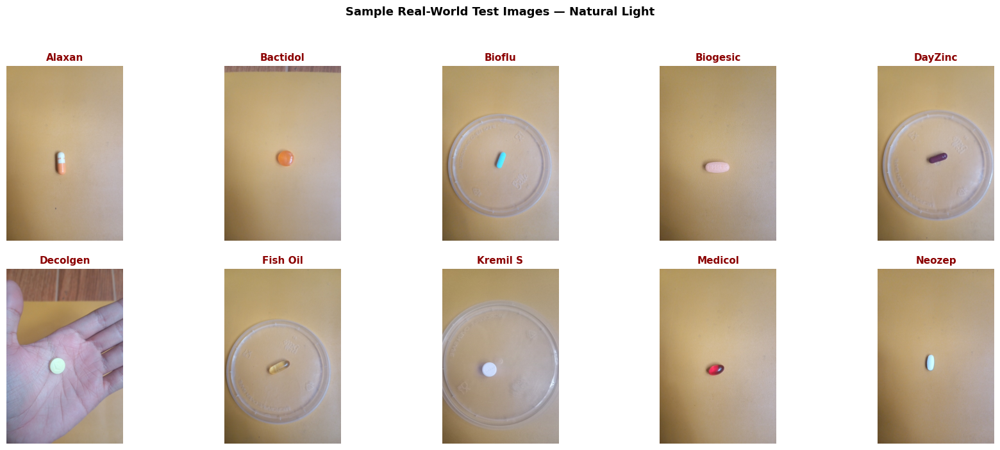

Sample test images saved for both lighting conditions.


In [11]:
# ── Representative Sample Images (Real-World Test Sets) ───────────────
# Displays one randomly selected image per class from each test subset.
for test_label, test_root in [('Fluorescent',   FLUOR_TEST_DIR),
                               ('Natural Light', NATURAL_TEST_DIR)]:
    fig, axes = plt.subplots(2, 5, figsize=(18, 7))
    axes = axes.flatten()
    for idx, cls in enumerate(CLASS_NAMES):
        cls_path = test_root / cls
        if cls_path.exists():
            img_files = list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png'))
            if img_files:
                img = Image.open(random.choice(img_files)).convert('RGB')
                axes[idx].imshow(img)
                axes[idx].set_title(cls, fontsize=11, fontweight='bold', color='darkred')
                axes[idx].axis('off')
    plt.suptitle(f'Sample Real-World Test Images — {test_label}',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    fname = test_label.lower().replace(' ', '_').replace('(', '').replace(')', '')
    plt.savefig(OUTPUT_DIR / f'sample_test_{fname}.png', dpi=150, bbox_inches='tight')
    plt.show()
print('Sample test images saved for both lighting conditions.')

In [12]:
# ── Per-Channel Pixel Statistics ───────────────────────────────────────
# Computes mean and standard deviation of pixel intensities per RGB
# channel across a 500-image sample. Values confirm that ImageNet
# normalisation constants (mean=[0.485,0.456,0.406],
# std=[0.229,0.224,0.225]) are appropriate for this dataset.
all_imgs = []
for cls in CLASS_NAMES:
    cls_path = TRAIN_DIR / cls
    files = list(cls_path.glob('*.jpg'))[:50]
    all_imgs.extend(files)

pixel_values = []
for f in all_imgs[:500]:
    img = np.array(Image.open(f).convert('RGB').resize((256, 256))) / 255.0
    pixel_values.append(img)

pixel_array = np.array(pixel_values)  # shape: (N, H, W, 3)
mean = pixel_array.mean(axis=(0, 1, 2))
std  = pixel_array.std(axis=(0, 1, 2))

print(f'Dataset Mean (RGB) : {mean.round(4)}')
print(f'Dataset Std  (RGB) : {std.round(4)}')
print('(These empirical values validate the use of standard ImageNet normalisation constants.)')

Dataset Mean (RGB) : [0.596  0.554  0.5098]
Dataset Std  (RGB) : [0.261  0.2565 0.2723]
(These empirical values validate the use of standard ImageNet normalisation constants.)


In [13]:
# ── Mark EDA complete ──────────────────────────────────────────────────
if not _SKIP_EDA:
    mark_section_complete("eda")

  Section 'eda' marked complete.


------------------------------------------------------------------------

## Section 3. Preprocessing, Augmentation, and the Shared 70/15/15 Split

In [14]:
# ── Data Preprocessing and Augmentation Pipelines ───────────────────────
# TRAIN_AUGMENT      : applied on-the-fly to training batches only.
# VAL_TEST_TRANSFORM : deterministic preprocessing for validation and all test sets.
#
# DOMAIN-RANDOMIZATION recipe for synthetic-only training → real-world inference.
# Because no real images are used in training (thesis constraint), the training
# distribution is deliberately widened so that real natural-light captures fall
# inside it. Augmentations target the specific sim-to-real gaps of outdoor /
# uneven-surface handheld photography:
#   - geometric : flips + affine + PERSPECTIVE warp (off-axis capture on uneven surfaces)
#   - lighting  : global brightness/contrast/gamma/tone + LOCAL directional shadow + glare
#   - colour    : MILD hue/sat/jitter only — kept small to protect colour-coded packaging
#                 (e.g. Bioflu, DayZinc, Decolgen); ToGray kept rare as a robustness prior
#   - sensor    : mild blur + ISO noise for handheld/optics realism
# All ops are standard Albumentations at moderate ranges; no real-image data is involved.

def apply_app_contrast(image, **kwargs):
    """Deterministic contrast boost (x1.2) mirroring the Flutter app preprocessing,
    applied to every split so training and on-device inference see the same input."""
    return np.array(ImageEnhance.Contrast(Image.fromarray(image)).enhance(1.2))


TRAIN_AUGMENT = A.Compose([
    A.Resize(CFG['img_size'], CFG['img_size']),
    A.Lambda(image=apply_app_contrast, p=1.0),

    # ── Geometric domain randomization ───────────────────────────────────
    # Flips + light affine (handheld framing), plus PERSPECTIVE warp to emulate
    # shooting down at an angle onto a flat/uneven surface (keystone distortion).
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.4),
    A.Perspective(scale=(0.04, 0.10), keep_size=True, fit_output=True,
                  pad_mode=cv2.BORDER_CONSTANT, pad_val=0, p=0.35),
    A.GridDistortion(num_steps=5, distort_limit=0.15,
                     border_mode=cv2.BORDER_CONSTANT, value=0, p=0.15),

    # ── Lighting domain randomization ────────────────────────────────────
    # Global exposure variation (over/under-exposure under daylight).
    A.RandomBrightnessContrast(brightness_limit=(0.00, 0.55),
                               contrast_limit=(-0.25, 0.05), p=0.45),
    A.RandomToneCurve(scale=0.25, p=0.30),
    A.RandomGamma(gamma_limit=(70, 130), p=0.40),

    # LOCAL directional shadow — an uneven surface / hand / phone partially
    # shading the box under hard sunlight (global brightness ops cannot do this).
    A.RandomShadow(shadow_roi=(0, 0, 1, 1), num_shadows_lower=1,
                   num_shadows_upper=2, shadow_dimension=5, p=0.30),

    # LOCAL glare / specular highlight — direct sun reflecting off glossy laminate.
    # Low intensity, no visible source circle, to mimic a small blown-out patch.
    A.RandomSunFlare(flare_roi=(0, 0, 1, 0.5), src_radius=120,
                     src_color=(255, 255, 255), angle_lower=0.0,
                     num_flare_circles_lower=0, num_flare_circles_upper=1, p=0.10),

    # ── Colour drift (kept MILD to preserve colour-coded packaging cues) ──
    A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=25, val_shift_limit=25, p=0.40),
    A.OneOf([
        A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=1.0),
    ], p=0.25),
    A.ColorJitter(brightness=0.40, contrast=0.40, saturation=0.30, hue=0.08, p=0.60),
    A.ToGray(p=0.05),

    # ── Sensor / optics realism ──────────────────────────────────────────
    A.GaussianBlur(blur_limit=(3, 5), p=0.20),
    A.ISONoise(color_shift=(0.01, 0.05), intensity=(0.10, 0.50), p=0.20),

    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

# Evaluation pipeline — deterministic preprocessing only (no augmentation).
# Unchanged: validation/test accuracy must stay reproducible and frozen.
VAL_TEST_TRANSFORM = A.Compose([
    A.Resize(CFG['img_size'], CFG['img_size']),
    A.Lambda(image=apply_app_contrast, p=1.0),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
])

print('Augmentation pipelines defined '
      '(domain-randomization recipe: flip + affine + perspective/grid + '
      'global & local lighting + glare + mild colour; train-split only).')

Augmentation pipelines defined (domain-randomization recipe: flip + affine + perspective/grid + global & local lighting + glare + mild colour; train-split only).


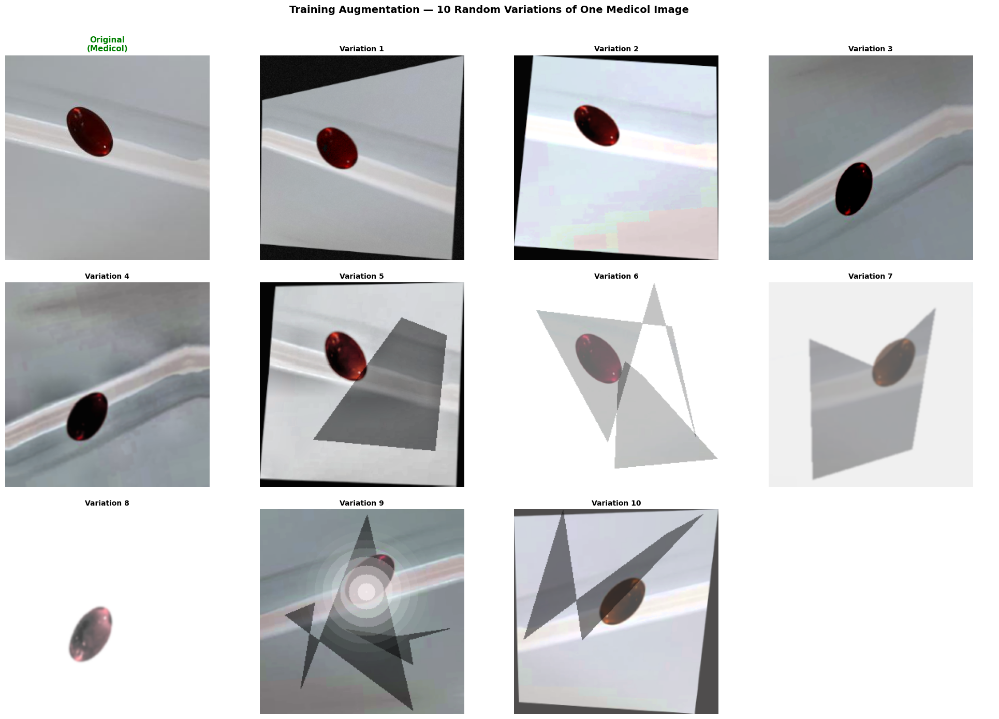

Augmentation preview saved: 10 variations of a Medicol sample.
Re-run this cell to preview a different image and new random variations.


In [15]:
# ── Augmentation Preview: 10 Random Variations of One Image ─────────────────
# Visual check that the training augmentation increases sample diversity while
# preserving the features needed to identify each drug. The preview mirrors the
# real TRAIN_AUGMENT pipeline exactly, dropping only the final Normalize and
# ToTensorV2 steps (which exist for the model, not for display) so pixels stay in
# the viewable [0, 255] range. A fresh image and 10 unique variations are drawn on
# every run, so re-running shows new samples.

# Build the display pipeline from TRAIN_AUGMENT, excluding Normalize / ToTensorV2.
_preview_transforms = [
    t for t in TRAIN_AUGMENT.transforms
    if not isinstance(t, (A.Normalize, ToTensorV2))
]
PREVIEW_AUG = A.Compose(_preview_transforms)

# Pick one random image from a random class (each run differs; sampling is
# intentionally unseeded here so the preview varies on re-run).
_preview_class = random.choice(CLASS_NAMES)
_preview_files = (list((TRAIN_DIR / _preview_class).glob('*.jpg')) +
                  list((TRAIN_DIR / _preview_class).glob('*.png')))
_preview_path = random.choice(_preview_files)
_original = np.array(Image.open(_preview_path).convert('RGB'))

# Generate 10 unique augmented variations of that single image.
N_VARIATIONS = 10
_variations = [PREVIEW_AUG(image=_original)['image'] for _ in range(N_VARIATIONS)]

# Lay out the original plus the 10 variations on a labelled grid (3 rows x 4 cols).
fig, axes = plt.subplots(3, 4, figsize=(20, 14))
axes = axes.flatten()

axes[0].imshow(_original)
axes[0].set_title(f'Original\n({_preview_class})', fontsize=11,
                  fontweight='bold', color='green')
axes[0].axis('off')

for idx, aug_img in enumerate(_variations, start=1):
    axes[idx].imshow(aug_img)
    axes[idx].set_title(f'Variation {idx}', fontsize=10)
    axes[idx].axis('off')

# The 12th panel is unused (1 original + 10 variations = 11 of 12 cells).
axes[11].axis('off')

plt.suptitle(f'Training Augmentation — 10 Random Variations of One {_preview_class} Image',
             fontsize=14, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'augmentation_preview.png', dpi=150, bbox_inches='tight')
plt.show()

print(f'Augmentation preview saved: 10 variations of a {_preview_class} sample.')
print('Re-run this cell to preview a different image and new random variations.')

In [16]:
# ── PillDataset: Custom PyTorch Dataset ────────────────────────────────
# Implements torch.utils.data.Dataset for the pill image directory.
# Expected directory structure:
#   root/
#     ClassName_A/image001.jpg
#     ClassName_B/image001.jpg
#     ...
# Label indices are derived from the sorted class name list to ensure
# a consistent, reproducible index-to-label mapping.
class PillDataset(Dataset):
    """
    Custom Dataset that loads pill images from folder structure:
    root/ClassName/image.jpg
    Applies Albumentations transforms.
    """
    def __init__(self, root_dir, class_names, transform=None):
        self.root_dir    = Path(root_dir)
        self.class_names = sorted(class_names)
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.class_names)}
        self.transform   = transform
        self.samples     = self._load_samples()

    def _load_samples(self):
        samples = []
        for cls in self.class_names:
            cls_path = self.root_dir / cls
            if not cls_path.exists():
                print(f'  Missing folder: {cls_path}')
                continue
            for ext in ['*.jpg', '*.jpeg', '*.png']:
                for img_path in cls_path.glob(ext):
                    samples.append((str(img_path), self.class_to_idx[cls]))
        return samples

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transform:
            image = self.transform(image=image)['image']
        return image, label

print(' PillDataset class defined.')

 PillDataset class defined.


In [17]:
# ── Dataset Construction and Strict 70/15/15 Stratified Split ──────────────
# All splits are computed on the raw file list BEFORE augmentation, so the
# train-only augmentation boundary is structurally guaranteed.

full_dataset = PillDataset(TRAIN_DIR, CLASS_NAMES, transform=None)
all_paths  = [s[0] for s in full_dataset.samples]
all_labels = [s[1] for s in full_dataset.samples]

# Step 1: reserve 15% as the held-out synthetic test set.
train_val_paths, synth_test_paths, train_val_labels, synth_test_labels = train_test_split(
    all_paths, all_labels, test_size=CFG['synth_test_split'],
    stratify=all_labels, random_state=SEED
)
# Step 2: split the 85% remainder into 70% train / 15% val of the full dataset.
val_ratio = CFG['val_split'] / (1.0 - CFG['synth_test_split'])   # 0.15/0.85
train_paths, val_paths, train_labels, val_labels = train_test_split(
    train_val_paths, train_val_labels, test_size=val_ratio,
    stratify=train_val_labels, random_state=SEED
)


class SplitDataset(Dataset):
    """Dataset built from an explicit list of (path, label) pairs."""
    def __init__(self, paths, labels, transform=None):
        self.samples = list(zip(paths, labels))
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        if self.transform:
            image = self.transform(image=image)['image']
        return image, label


# Augmentation boundary: ONLY the training set receives TRAIN_AUGMENT.
train_dataset      = SplitDataset(train_paths,      train_labels,      TRAIN_AUGMENT)
val_dataset        = SplitDataset(val_paths,        val_labels,        VAL_TEST_TRANSFORM)
synth_test_dataset = SplitDataset(synth_test_paths, synth_test_labels, VAL_TEST_TRANSFORM)

train_loader = DataLoader(train_dataset, batch_size=CFG['batch_size'], shuffle=True,
                          num_workers=CFG['num_workers'], pin_memory=True,
                          worker_init_fn=seed_worker, generator=loader_generator)
val_loader = DataLoader(val_dataset, batch_size=CFG['batch_size'], shuffle=False,
                        num_workers=CFG['num_workers'], pin_memory=True,
                        worker_init_fn=seed_worker)
synth_test_loader = DataLoader(synth_test_dataset, batch_size=1, shuffle=False,
                               num_workers=CFG['num_workers'], worker_init_fn=seed_worker)

# ── Strict split + augmentation-boundary assertions ───────────────────────
total = len(all_paths)
assert total == len(train_paths) + len(val_paths) + len(synth_test_paths)
# No leakage between partitions.
assert set(train_paths).isdisjoint(val_paths)
assert set(train_paths).isdisjoint(synth_test_paths)
assert set(val_paths).isdisjoint(synth_test_paths)
# Proportions within 1% of the strict 70/15/15 target.
for name, part, target in [('train', train_paths, CFG['train_split']),
                           ('val', val_paths, CFG['val_split']),
                           ('synth_test', synth_test_paths, CFG['synth_test_split'])]:
    assert abs(len(part) / total - target) < 0.01, f'{name} ratio off target'
# Augmentation boundary: only the training set carries TRAIN_AUGMENT.
assert train_dataset.transform is TRAIN_AUGMENT
assert val_dataset.transform is VAL_TEST_TRANSFORM
assert synth_test_dataset.transform is VAL_TEST_TRANSFORM


def split_balance(labels, name):
    c = Counter(labels)
    ratios = {CLASS_NAMES[k]: f'{v/len(labels)*100:.1f}%' for k, v in sorted(c.items())}
    print(f'   {name}: {len(labels)} samples | {ratios}')

print('Strict 70/15/15 stratified split verified (no leakage; augmentation train-only).')
split_balance(train_labels,      'Train       ')
split_balance(val_labels,        'Val         ')
split_balance(synth_test_labels, 'Synth Test  ')
print(f'   Train batches: {len(train_loader)} | Val batches: {len(val_loader)}')

Strict 70/15/15 stratified split verified (no leakage; augmentation train-only).
   Train       : 7000 samples | {'Alaxan': '10.0%', 'Bactidol': '10.0%', 'Bioflu': '10.0%', 'Biogesic': '10.0%', 'DayZinc': '10.0%', 'Decolgen': '10.0%', 'Fish Oil': '10.0%', 'Kremil S': '10.0%', 'Medicol': '10.0%', 'Neozep': '10.0%'}
   Val         : 1500 samples | {'Alaxan': '10.0%', 'Bactidol': '10.0%', 'Bioflu': '10.0%', 'Biogesic': '10.0%', 'DayZinc': '10.0%', 'Decolgen': '10.0%', 'Fish Oil': '10.0%', 'Kremil S': '10.0%', 'Medicol': '10.0%', 'Neozep': '10.0%'}
   Synth Test  : 1500 samples | {'Alaxan': '10.0%', 'Bactidol': '10.0%', 'Bioflu': '10.0%', 'Biogesic': '10.0%', 'DayZinc': '10.0%', 'Decolgen': '10.0%', 'Fish Oil': '10.0%', 'Kremil S': '10.0%', 'Medicol': '10.0%', 'Neozep': '10.0%'}
   Train batches: 219 | Val batches: 47


------------------------------------------------------------------------

## Section 4. Shared Functions (used identically by both models)

These define the entire per-model pipeline once. The driver loop in Section 5 calls them for each entry in `MODEL_SPECS`.

In [18]:
# ── Generic Model Builder (Freeze + Unfreeze Progressive Fine-Tuning) ────────
# Both MobileViT-XS and MobileNetV2 are created through the same timm API with the
# same freeze/unfreeze logic; only the timm tag (from the spec) differs. Using one
# builder for both removes any chance of an accidental construction difference.
def build_model(spec, pretrained=True, freeze_backbone=True):
    model = timm.create_model(spec["timm_tag"], pretrained=pretrained,
                              num_classes=CFG["num_classes"])
    if freeze_backbone:
        for p in model.parameters():
            p.requires_grad = False
        for p in model.get_classifier().parameters():
            p.requires_grad = True
    else:
        for p in model.parameters():
            p.requires_grad = True
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"[{spec['label']}] total params: {total:,} | trainable: {trainable:,} | frozen: {total-trainable:,}")
    return model


In [19]:
# ── Training Helpers: Loss, Train, and Validate ───────────────────────────
# Defined once and reused across both training phases. The freeze state of the
# model parameters (set during model construction) determines what actually updates.

def make_class_weights(device):
    """Uniform class weights (all classes weighted equally).

    The dataset is balanced (1,000 images per class, stratified 70/15/15), so no
    per-class re-weighting is applied; every class is treated equally."""
    return torch.ones(CFG['num_classes']).to(device)


def make_criterion(device):
    """Label-smoothed cross-entropy with uniform (unweighted) class loss."""
    return nn.CrossEntropyLoss(label_smoothing=CFG['label_smooth'])


def train_one_epoch(model, loader, criterion, optimizer, device):
    """One full forward + backward pass over the training set."""
    model.train()
    total_loss, correct, total = 0.0, 0, 0
    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        correct += outputs.argmax(dim=1).eq(labels).sum().item()
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * images.size(0)
        total += images.size(0)
    return total_loss / total, correct / total


def validate(model, loader, criterion, device):
    """Evaluation pass — no gradient computation."""
    model.eval()
    total_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            total_loss += criterion(outputs, labels).item() * images.size(0)
            correct += outputs.argmax(dim=1).eq(labels).sum().item()
            total += images.size(0)
    return total_loss / total, correct / total

print('Training helpers defined (make_criterion, train_one_epoch, validate).')


Training helpers defined (make_criterion, train_one_epoch, validate).


In [20]:
# ── Two-Phase Training (Phase 1 frozen warm-up → Phase 2 full fine-tune) ─────
# Identical schedule for both models (thesis Table 6/7): Phase 1 trains only the
# head at LR 1e-3 with CosineAnnealingLR for 15 epochs; Phase 2 unfreezes the whole
# network at LR 1e-5 with CosineAnnealingWarmRestarts (T_0=10, T_mult=2, eta_min=1e-7)
# for up to CFG["epochs"] epochs with early stopping (patience = CFG["patience"]).
PHASE1_EPOCHS = 15
PHASE1_LR     = 1e-3
PHASE2_LR     = 1e-5

def train_two_phase(spec):
    paths   = spec_paths(spec)
    device  = CFG["device"]
    label   = spec["label"]

    # ---------- Phase 1: warm-up (frozen backbone) ----------
    print("="*70); print(f"[{label}] PHASE 1 — warm-up (backbone frozen)"); print("="*70)
    model = build_model(spec, pretrained=True, freeze_backbone=True).to(device)
    criterion = make_criterion(device)
    optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()),
                                  lr=PHASE1_LR, weight_decay=CFG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=PHASE1_EPOCHS)
    best_val_acc, phase1_log = 0.0, []
    for epoch in range(1, PHASE1_EPOCHS+1):
        t0 = time.time()
        tr_loss, tr_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)
        va_loss, va_acc = validate(model, val_loader, criterion, device)
        scheduler.step()
        if va_acc > best_val_acc:
            best_val_acc = va_acc
            torch.save({"epoch":epoch,"model_state":model.state_dict(),"val_acc":best_val_acc,"phase":1},
                       paths["phase1_ckpt"])
            tag = "BEST"
        else:
            tag = ""
        phase1_log.append({"epoch":epoch,"train_loss":tr_loss,"train_acc":tr_acc,
                           "val_loss":va_loss,"val_acc":va_acc,"time":time.time()-t0})
        print(f"  E{epoch:02d}/{PHASE1_EPOCHS} | tr_acc {tr_acc:.4f} | va_acc {va_acc:.4f} | "
              f"lr {scheduler.get_last_lr()[0]:.2e} | {tag}")
    print(f"[{label}] Phase 1 best val acc: {best_val_acc:.4f}")

    # ---------- Phase 2: full fine-tune (unfrozen) ----------
    print("="*70); print(f"[{label}] PHASE 2 — full fine-tune (backbone unfrozen)"); print("="*70)
    model = build_model(spec, pretrained=False, freeze_backbone=False).to(device)
    ckpt1 = torch.load(paths["phase1_ckpt"], map_location=device)
    model.load_state_dict(ckpt1["model_state"])
    criterion = make_criterion(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=PHASE2_LR, weight_decay=CFG["weight_decay"])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2, eta_min=1e-7)
    best_val_acc = ckpt1["val_acc"]; patience_ctr = 0; phase2_log = []
    last_epoch = 0
    for epoch in range(1, CFG["epochs"]+1):
        last_epoch = epoch
        t0 = time.time()
        tr_loss, tr_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)
        va_loss, va_acc = validate(model, val_loader, criterion, device)
        scheduler.step(epoch-1)
        if va_acc > best_val_acc:
            best_val_acc = va_acc; patience_ctr = 0
            torch.save({"epoch":epoch,"model_state":model.state_dict(),"val_acc":best_val_acc,
                        "train_log":phase2_log,"phase":2}, paths["best_ckpt"])
            tag = "★ BEST"
        else:
            patience_ctr += 1; tag = ""
        phase2_log.append({"epoch":epoch,"train_loss":tr_loss,"train_acc":tr_acc,
                           "val_loss":va_loss,"val_acc":va_acc,"time":time.time()-t0})
        print(f"  E{epoch:02d}/{CFG['epochs']} | tr_acc {tr_acc:.4f} | va_acc {va_acc:.4f} | "
              f"lr {scheduler.get_last_lr()[0]:.2e} | {tag}")
        if patience_ctr >= CFG["patience"]:
            print(f"  Early stopping at epoch {epoch} (no improvement for {CFG['patience']} epochs).")
            break
    print(f"[{label}] Phase 2 best val acc: {best_val_acc:.4f} | epochs run: {last_epoch}")
    return {"phase1_log":phase1_log, "phase2_log":phase2_log,
            "best_val_acc":float(best_val_acc), "phase2_epochs_run":last_epoch}


In [21]:
# ── Training Curve Visualisation (per model) ──────────────────────────
def plot_training_curves(spec, logs):
    combined = logs["phase1_log"] + logs["phase2_log"]
    if not combined:
        print("No training log to plot."); return
    xs = list(range(1, len(combined)+1)); p1_end = len(logs["phase1_log"])
    tl = [e["train_loss"] for e in combined]; vl = [e["val_loss"] for e in combined]
    ta = [e["train_acc"]*100 for e in combined]; va = [e["val_acc"]*100 for e in combined]
    label = spec["label"]
    fig, ax = plt.subplots(1, 2, figsize=(16,5))
    ax[0].plot(xs, tl, "b-o", ms=3, label="Train Loss"); ax[0].plot(xs, vl, "r-o", ms=3, label="Val Loss")
    if p1_end>0: ax[0].axvline(p1_end, color="gray", ls="--", alpha=0.7, label="Phase 1→2")
    ax[0].set_title(f"Loss — {label} (Phase 1 + Phase 2)", fontweight="bold")
    ax[0].set_xlabel("Epoch"); ax[0].set_ylabel("Loss"); ax[0].legend(); ax[0].grid(True, alpha=0.4)
    ax[1].plot(xs, ta, "b-o", ms=3, label="Train Acc"); ax[1].plot(xs, va, "r-o", ms=3, label="Val Acc")
    if p1_end>0: ax[1].axvline(p1_end, color="gray", ls="--", alpha=0.7, label="Phase 1→2")
    ax[1].axhline(logs["best_val_acc"]*100, color="green", ls="--", alpha=0.7,
                  label=f"Best Val {logs['best_val_acc']*100:.2f}%")
    ax[1].set_title(f"Accuracy — {label} (Phase 1 + Phase 2)", fontweight="bold")
    ax[1].set_xlabel("Epoch"); ax[1].set_ylabel("Accuracy (%)"); ax[1].legend(); ax[1].grid(True, alpha=0.4)
    plt.tight_layout(); plt.savefig(OUTPUT_DIR / f"{spec['key']}_training_curves.png", dpi=150); plt.show()


In [22]:
# ── Single-Image Inference Function ────────────────────────────────────
# predict_single() accepts an image file path and returns the predicted
# class label, softmax confidence score, and per-image inference latency.
# Input preprocessing follows the VAL_TEST_TRANSFORM pipeline to match
# the conditions used during model evaluation.
def predict_single(image_path, model, transform, class_names, device):
    """
    Classifies a single image.
    Returns: (filename, predicted_class, confidence_percent, inference_ms)
    """
    image_path = Path(image_path)
    image = cv2.imread(str(image_path))
    if image is None:
        return str(image_path.name), 'ERROR: Cannot read image', 0.0, 0.0

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    tensor = transform(image=image)['image'].unsqueeze(0).to(device)

    model.eval()
    with torch.no_grad():
        t0      = time.time()
        outputs = model(tensor)
        t1      = time.time()

    probs      = torch.softmax(outputs, dim=1)[0]
    pred_idx   = probs.argmax().item()
    confidence = probs[pred_idx].item() * 100
    inf_ms     = (t1 - t0) * 1000

    return image_path.name, class_names[pred_idx], round(confidence, 2), round(inf_ms, 2)


print(' Inference helper defined.')

 Inference helper defined.


In [23]:
# ── Shared Evaluation Function (single-pass, deterministic; no TTA) ────────
# Reports accuracy, weighted precision/recall/F1, mean per-image latency, raw +
# normalised confusion matrices, a per-class report, and a sample-prediction grid.

def evaluate_dataset(test_dir, dataset_label, model, transform, class_names,
                     device, output_dir, save_prefix, model_label='Model', plot=True):
    """Evaluate the model on a labelled folder hierarchy (root/ClassName/img.jpg)."""
    test_dir, output_dir = Path(test_dir), Path(output_dir)
    all_preds, all_labels, all_probs, inference_times = [], [], [], []
    model.eval()

    for cls_name in sorted(class_names):
        cls_path = test_dir / cls_name
        if not cls_path.exists():
            continue
        label_idx = class_names.index(cls_name)
        for img_path in list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png')):
            image = cv2.imread(str(img_path))
            if image is None:
                continue
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            t0 = time.time()
            tensor = transform(image=image)['image'].unsqueeze(0).to(device)
            with torch.no_grad():
                logits = model(tensor)
            probs = torch.softmax(logits, dim=1)[0].cpu().numpy()
            inference_times.append((time.time() - t0) * 1000)   # per-image latency (ms)
            all_probs.append(probs)
            all_preds.append(int(probs.argmax()))
            all_labels.append(label_idx)

    acc = accuracy_score(all_labels, all_preds)
    prec, rec, f1, _ = precision_recall_fscore_support(
        all_labels, all_preds, average='weighted', zero_division=0)
    avg_ms = float(np.mean(inference_times)) if inference_times else 0.0
    result = {'preds': all_preds, 'labels': all_labels, 'probs': all_probs,
              'accuracy': acc, 'precision': prec, 'recall': rec, 'f1': f1, 'avg_inf_ms': avg_ms}

    print(f'\n{"="*60}')
    print(f'  {dataset_label}')
    print(f'{"="*60}')
    print(f'  Accuracy  : {acc*100:.2f}%')
    print(f'  Precision : {prec*100:.2f}%')
    print(f'  Recall    : {rec*100:.2f}%')
    print(f'  F1        : {f1*100:.2f}%')
    print(f'  Avg Inf.  : {avg_ms:.2f} ms/image')

    if not plot:
        return result   # compute-only; figures shown together in the comparison section

    # Confusion matrices — raw counts and row-normalised (parity with synthetic set).
    cm = confusion_matrix(all_labels, all_preds)
    cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True).clip(min=1)
    fig, axcm = plt.subplots(1, 2, figsize=(20, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names, ax=axcm[0])
    axcm[0].set_title(f'Confusion Matrix (Counts) — {dataset_label}', fontweight='bold')
    axcm[0].set_xlabel('Predicted'); axcm[0].set_ylabel('True')
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Greens', vmin=0, vmax=1,
                xticklabels=class_names, yticklabels=class_names, ax=axcm[1])
    axcm[1].set_title(f'Confusion Matrix (Normalised) — {dataset_label}', fontweight='bold')
    axcm[1].set_xlabel('Predicted'); axcm[1].set_ylabel('True')
    plt.tight_layout()
    plt.savefig(output_dir / f'{save_prefix}_confusion_matrix.png', dpi=150)
    plt.show()

    print(f'\nClassification Report — {dataset_label}')
    print(classification_report(all_labels, all_preds, target_names=class_names,
                                zero_division=0, digits=4))

    # Sample prediction grid (one random image per class).
    fig2, axes2 = plt.subplots(2, 5, figsize=(20, 9))
    axes2 = axes2.flatten()
    for cls_idx, cls_name in enumerate(class_names):
        cls_path = Path(test_dir) / cls_name
        files = (list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png'))
                 if cls_path.exists() else [])
        if not files:
            axes2[cls_idx].axis('off'); continue
        img_path = random.choice(files)
        _, pred_class, confidence, _ = predict_single(img_path, model, transform, class_names, device)
        axes2[cls_idx].imshow(np.array(Image.open(img_path).convert('RGB')))
        axes2[cls_idx].set_title(f'True: {cls_name}\nPred: {pred_class} ({confidence:.1f}%)',
                                 fontsize=14, fontweight='bold',
                                 color='green' if pred_class == cls_name else 'red')
        axes2[cls_idx].axis('off')
    plt.suptitle(f'Sample Predictions — {model_label} | {dataset_label}',
                 fontsize=20, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.savefig(output_dir / f'{save_prefix}_sample_predictions.png', dpi=150, bbox_inches='tight')
    plt.show()

    return result

print('evaluate_dataset() defined (single-pass; raw + normalised confusion matrices).')

evaluate_dataset() defined (single-pass; raw + normalised confusion matrices).


In [24]:
# ── Grad-CAM on Misclassified Real-World Images ────────────────────────
# Visualises where MobileNetV2 looks when it predicts the WRONG class on the
# real-world test sets. Pure PyTorch hooks (no extra dependency). The target
# layer is the last conv stage of MobileNetV2 (model.conv_head in timm).

import torch.nn.functional as F


def _find_target_layer(model):
    """Return the last convolutional layer for Grad-CAM.
    For timm MobileNetV2 this is `conv_head`; fall back to the last nn.Conv2d."""
    if hasattr(model, 'conv_head') and isinstance(model.conv_head, nn.Conv2d):
        return model.conv_head
    last_conv = None
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            last_conv = m
    return last_conv


class GradCAM:
    """Minimal Grad-CAM: hooks one conv layer, returns a [0,1] heatmap for a
    chosen class index."""
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None
        self._fwd = target_layer.register_forward_hook(self._save_act)
        self._bwd = target_layer.register_full_backward_hook(self._save_grad)

    def _save_act(self, module, inp, out):
        self.activations = out.detach()

    def _save_grad(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach()

    def remove(self):
        self._fwd.remove(); self._bwd.remove()

    def __call__(self, input_tensor, class_idx):
        self.model.eval()
        self.model.zero_grad()
        logits = self.model(input_tensor)
        score = logits[0, class_idx]
        score.backward(retain_graph=False)
        # Global-average-pool the gradients to get per-channel weights.
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)        # [1,C,1,1]
        cam = (weights * self.activations).sum(dim=1, keepdim=True)    # [1,1,h,w]
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=(CFG['img_size'], CFG['img_size']),
                            mode='bilinear', align_corners=False)
        cam = cam[0, 0].cpu().numpy()
        cam -= cam.min()
        if cam.max() > 1e-8:
            cam /= cam.max()
        return cam


def _overlay_heatmap(rgb_uint8, cam, alpha=0.45):
    """Blend a [0,1] Grad-CAM map over an RGB image as a JET overlay."""
    heat = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heat = cv2.cvtColor(heat, cv2.COLOR_BGR2RGB)
    base = cv2.resize(rgb_uint8, (cam.shape[1], cam.shape[0]))
    return np.uint8((1 - alpha) * base + alpha * heat)


def collect_misclassified(model, test_dir, class_names):
    """Re-run single-image inference and return every misclassified sample as
    (img_path, true_name, pred_name, confidence%)."""
    test_dir = Path(test_dir)
    wrong = []
    for cls_name in sorted(class_names):
        cls_path = test_dir / cls_name
        if not cls_path.exists():
            continue
        for img_path in list(cls_path.glob('*.jpg')) + list(cls_path.glob('*.png')):
            img = cv2.imread(str(img_path))
            if img is None:
                continue
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            tensor = VAL_TEST_TRANSFORM(image=img)['image'].unsqueeze(0).to(CFG['device'])
            with torch.no_grad():
                probs = torch.softmax(model(tensor), dim=1)[0].cpu().numpy()
            pred_idx = int(probs.argmax())
            if class_names[pred_idx] != cls_name:
                wrong.append((img_path, cls_name, class_names[pred_idx],
                              float(probs[pred_idx] * 100)))
    return wrong


def gradcam_gallery(model, test_dir, condition_label, class_names, save_prefix, model_label='Model', cols=4):
    """Render a Grad-CAM gallery for every misclassified image in one condition.
    Each panel shows the original image with the heatmap of the PREDICTED
    (wrong) class, so you can see what the model latched onto."""
    wrong = collect_misclassified(model, test_dir, class_names)
    print(f'{condition_label}: {len(wrong)} misclassified image(s).')
    if not wrong:
        print('  No misclassifications to visualise for this condition.')
        return wrong

    target_layer = _find_target_layer(model)
    cam_engine = GradCAM(model, target_layer)

    rows = int(np.ceil(len(wrong) / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = np.array(axes).reshape(-1)

    for k, (img_path, true_name, pred_name, conf) in enumerate(wrong):
        img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
        tensor = VAL_TEST_TRANSFORM(image=img)['image'].unsqueeze(0).to(CFG['device'])
        pred_idx = class_names.index(pred_name)
        cam = cam_engine(tensor, pred_idx)
        # Display over the resized, contrast-matched image for a faithful view.
        disp = cv2.resize(img, (CFG['img_size'], CFG['img_size']))
        overlay = _overlay_heatmap(disp, cam)
        axes[k].imshow(overlay)
        axes[k].set_title(f'True: {true_name}\nPred: {pred_name} ({conf:.1f}%)',
                          fontsize=14, fontweight='bold', color='red')
        axes[k].axis('off')

    for j in range(len(wrong), len(axes)):
        axes[j].axis('off')

    cam_engine.remove()
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / f'{save_prefix}_gradcam_misclassified.png',
                dpi=150, bbox_inches='tight')
    plt.show()
    return wrong


In [25]:
# ── Synthetic test-set evaluation via the held-out split loader ────────────
def evaluate_synthetic(spec, model, plot=True):
    """Evaluate the 15%% held-out synthetic split (uses synth_test_loader)."""
    dev = CFG["device"]; model.eval()
    preds, labels, probs, times = [], [], [], []
    with torch.no_grad():
        for images, lbls in synth_test_loader:
            images = images.to(dev)
            t0 = time.time(); out = model(images); dt = (time.time()-t0)*1000
            p = torch.softmax(out, dim=1).cpu().numpy()
            preds.extend(p.argmax(1).tolist()); labels.extend(lbls.tolist())
            probs.extend(list(p)); times.append(dt/len(images))
    acc = accuracy_score(labels, preds)
    prec, rec, f1, _ = precision_recall_fscore_support(labels, preds, average="weighted", zero_division=0)
    print(f"[{spec['label']}] Synthetic Test Set | acc {acc*100:.2f}%% | f1 {f1*100:.2f}%%")
    result = {"preds":preds, "labels":labels, "probs":probs, "accuracy":acc,
              "precision":prec, "recall":rec, "f1":f1, "avg_inf_ms":float(np.mean(times)) if times else 0.0}
    if not plot:
        return result   # compute-only; figures shown together in the comparison section
    cm = confusion_matrix(labels, preds)
    cm_norm = cm.astype("float") / cm.sum(axis=1, keepdims=True).clip(min=1)
    fig, ax = plt.subplots(1, 2, figsize=(20,8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax[0])
    ax[0].set_title(f"Confusion (Counts) — {spec['label']} | Synthetic", fontweight="bold")
    ax[0].set_xlabel("Predicted"); ax[0].set_ylabel("True")
    sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Greens", vmin=0, vmax=1, xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax[1])
    ax[1].set_title(f"Confusion (Normalised) — {spec['label']} | Synthetic", fontweight="bold")
    ax[1].set_xlabel("Predicted"); ax[1].set_ylabel("True")
    plt.tight_layout(); plt.savefig(OUTPUT_DIR / f"{spec['key']}_synthetic_confusion_matrix.png", dpi=150); plt.show()
    print(classification_report(labels, preds, target_names=CLASS_NAMES, zero_division=0, digits=4))
    return result


In [26]:
# ── Full evaluation for one model: synthetic + fluorescent + natural ────────
def evaluate_model(spec, model, plot=False):
    label, key, dev = spec["label"], spec["key"], CFG["device"]
    print("#"*70); print(f"#  EVALUATION — {label}"); print("#"*70)
    res = {}
    res["synthetic"]   = evaluate_synthetic(spec, model, plot=plot)
    res["fluorescent"] = evaluate_dataset(FLUOR_TEST_DIR, "Fluorescent Light", model,
        VAL_TEST_TRANSFORM, CLASS_NAMES, dev, OUTPUT_DIR, f"{key}_fluorescent", model_label=label, plot=plot)
    res["natural"]     = evaluate_dataset(NATURAL_TEST_DIR, "Natural Light", model,
        VAL_TEST_TRANSFORM, CLASS_NAMES, dev, OUTPUT_DIR, f"{key}_natural", model_label=label, plot=plot)
    return res


In [27]:
# ── Grad-CAM galleries (misclassified only) for one model, both conditions ──
def run_gradcam(spec, model):
    label, key = spec["label"], spec["key"]
    print("#"*70); print(f"#  GRAD-CAM (misclassified) — {label}"); print("#"*70)
    wrong_f = gradcam_gallery(model, FLUOR_TEST_DIR, "Fluorescent Light",
                              CLASS_NAMES, f"{key}_fluorescent", model_label=label)
    wrong_n = gradcam_gallery(model, NATURAL_TEST_DIR, "Natural Light",
                              CLASS_NAMES, f"{key}_natural", model_label=label)
    print(f"[{label}] misclassified — fluorescent: {len(wrong_f)} | natural: {len(wrong_n)}")
    return {"fluorescent": wrong_f, "natural": wrong_n}


In [28]:
# ── Export one model: PyTorch → ONNX → TFLite (for the Flutter app) ─────────
def export_model(spec, model):
    import gc, glob, shutil
    paths = spec_paths(spec); label = spec["label"]
    onnx_path = str(paths["onnx"]); tf_dir = str(paths["tf_dir"]); tflite_path = str(paths["tflite"])
    print("#"*70); print(f"#  EXPORT — {label}"); print("#"*70)
    torch.cuda.empty_cache(); gc.collect()
    model.eval(); model.cpu()
    dummy = torch.randn(1, 3, CFG["img_size"], CFG["img_size"])
    print(f"[{label}] Step 1/2: PyTorch → ONNX ...")
    try:
        torch.onnx.export(model, dummy, onnx_path, export_params=True, opset_version=17,
                          do_constant_folding=True, input_names=["input"], output_names=["output"], dynamo=False)
    except TypeError:
        torch.onnx.export(model, dummy, onnx_path, export_params=True, opset_version=17,
                          do_constant_folding=True, input_names=["input"], output_names=["output"])
    import onnx as _onnx
    _onnx.checker.check_model(_onnx.load(onnx_path))
    onnx_mb = os.path.getsize(onnx_path)/(1024*1024)
    print(f"    ONNX -> {onnx_path} ({onnx_mb:.2f} MB)")
    print(f"[{label}] Step 2/2: ONNX → TFLite (onnx2tf) ...")
    import onnx2tf
    try:
        onnx2tf.convert(input_onnx_file_path=onnx_path, output_folder_path=tf_dir,
                        copy_onnx_input_output_names_to_tflite=True)
    except TypeError:
        onnx2tf.convert(input_onnx_file_path=onnx_path, output_folder_path=tf_dir)
    cands = (glob.glob(f"{tf_dir}/**/*float32.tflite", recursive=True)
             or glob.glob(f"{tf_dir}/**/*.tflite", recursive=True))
    if not cands:
        raise FileNotFoundError(f"No .tflite produced in {tf_dir}: {os.listdir(tf_dir)}")
    shutil.copy(cands[0], tflite_path)
    tfl_mb = os.path.getsize(tflite_path)/(1024*1024)
    print(f"    TFLite -> {tflite_path} ({tfl_mb:.2f} MB)")
    # Restore model to the compute device for any later use.
    model.to(CFG["device"])
    return {"onnx_mb": onnx_mb, "tflite_mb": tfl_mb, "tflite_path": tflite_path}


In [29]:
# Export dependencies (unpinned: onnx2tf must match Kaggle\u2019s TensorFlow build).
!pip install -q onnx2tf onnxsim sng4onnx onnxruntime onnx
import os, logging, warnings
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
os.environ["CUDA_VISIBLE_DEVICES"] = ""   # force CPU for the TF/onnx2tf step
logging.getLogger("tensorflow").setLevel(logging.ERROR)
warnings.filterwarnings("ignore")
print("Export dependencies installed.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 223.2/223.2 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 72.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.2/17.2 MB 84.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 85.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.3/16.3 MB 57.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 73.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 65.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 48.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 28.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 57.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 26.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 k

------------------------------------------------------------------------

## Section 5. Run the Full Pipeline for Both Models

This single loop trains each model fresh, plots its curves, evaluates it on all three test sets, runs Grad-CAM on its misclassified real-world images, and exports it to TFLite. All artifacts are written per model (prefixed by the model key) and all results are collected into `RESULTS` for the comparison section.

In [30]:
# ── Train BOTH models first (compute-only); all figures are shown together in
#    the combined comparison section below. ──────────────────────────────────
RESULTS = {}
for spec in MODEL_SPECS:
    print("\n" + "="*78)
    print(f"  TRAINING: {spec['label']}  ({spec['timm_tag']})")
    print("="*78)
    logs = train_two_phase(spec)                      # Phase 1 + Phase 2 (fresh)
    model = build_model(spec, pretrained=False, freeze_backbone=False).to(CFG["device"])
    ckpt = torch.load(spec_paths(spec)["best_ckpt"], map_location=CFG["device"])
    model.load_state_dict(ckpt["model_state"]); model.eval()
    print(f"[{spec['label']}] best checkpoint loaded (epoch {ckpt['epoch']}).")
    eval_res = evaluate_model(spec, model, plot=False)   # metrics only, no figures yet
    exp_res  = export_model(spec, model)
    RESULTS[spec["key"]] = {"label": spec["label"], "training": logs,
                            "eval": eval_res, "export": exp_res}
    del model; torch.cuda.empty_cache()
print("\nBoth models trained and evaluated. Keys in RESULTS:", list(RESULTS.keys()))
print("Figures (training curves, confusion matrices, Grad-CAM) are rendered together below.")



  TRAINING: MobileViT-XS  (mobilevit_xs.cvnets_in1k)
[MobileViT-XS] PHASE 1 — warm-up (backbone frozen)


model.safetensors:   0%|          | 0.00/9.34M [00:00<?, ?B/s]

[MobileViT-XS] total params: 1,936,698 | trainable: 3,850 | frozen: 1,932,848
  E01/15 | tr_acc 0.4464 | va_acc 0.5973 | lr 9.89e-04 | BEST
  E02/15 | tr_acc 0.5196 | va_acc 0.6620 | lr 9.57e-04 | BEST
  E03/15 | tr_acc 0.5496 | va_acc 0.6833 | lr 9.05e-04 | BEST
  E04/15 | tr_acc 0.5614 | va_acc 0.6987 | lr 8.35e-04 | BEST
  E05/15 | tr_acc 0.5703 | va_acc 0.7053 | lr 7.50e-04 | BEST
  E06/15 | tr_acc 0.5797 | va_acc 0.7253 | lr 6.55e-04 | BEST
  E07/15 | tr_acc 0.5870 | va_acc 0.7240 | lr 5.52e-04 | 
  E08/15 | tr_acc 0.5959 | va_acc 0.7373 | lr 4.48e-04 | BEST
  E09/15 | tr_acc 0.5829 | va_acc 0.7293 | lr 3.45e-04 | 
  E10/15 | tr_acc 0.5909 | va_acc 0.7247 | lr 2.50e-04 | 
  E11/15 | tr_acc 0.5896 | va_acc 0.7413 | lr 1.65e-04 | BEST
  E12/15 | tr_acc 0.5946 | va_acc 0.7287 | lr 9.55e-05 | 
  E13/15 | tr_acc 0.5980 | va_acc 0.7473 | lr 4.32e-05 | BEST
  E14/15 | tr_acc 0.5989 | va_acc 0.7340 | lr 1.09e-05 | 
  E15/15 | tr_acc 0.5917 | va_acc 0.7387 | lr 0.00e+00 | 
[MobileViT-XS] P

flatbuffer_direct lowering:   0%|          | 0/378 [00:00<?, ?it/s]

flatbuffer_direct post-lowering:   0%|          | 0/6 [00:00<?, ?it/s]

flatbuffer_direct export:   0%|          | 0/3 [00:00<?, ?it/s]

flatbuffer_direct write timing: stage=float32 mode=builder_direct total=0.070s serialize=0.064s (sanitize=0.001s build=0.009s pack=0.054s output=0.001s) write=0.005s size=7.53MB
flatbuffer_direct write timing: stage=float16 mode=builder_direct total=0.064s serialize=0.061s (sanitize=0.001s build=0.005s pack=0.054s output=0.000s) write=0.002s size=3.85MB
Float32 tflite output complete! (/kaggle/working/medisina_output/mobilevit_xs_tf/mobilevit_xs_float32.tflite)
Float16 tflite output complete! (/kaggle/working/medisina_output/mobilevit_xs_tf/mobilevit_xs_float16.tflite)
Tensor correspondence report output complete! (/kaggle/working/medisina_output/mobilevit_xs_tf/mobilevit_xs_tensor_correspondence_report.json)
Input/Output tensor names are directly written from ONNX graph in flatbuffer_direct backend.
    TFLite -> /kaggle/working/medisina_output/mobilevit_xs.tflite (7.53 MB)

  TRAINING: MobileNetV2  (mobilenetv2_100.ra_in1k)
[MobileNetV2] PHASE 1 — warm-up (backbone frozen)


model.safetensors:   0%|          | 0.00/14.2M [00:00<?, ?B/s]

[MobileNetV2] total params: 2,236,682 | trainable: 12,810 | frozen: 2,223,872
  E01/15 | tr_acc 0.1963 | va_acc 0.3860 | lr 9.89e-04 | BEST
  E02/15 | tr_acc 0.3244 | va_acc 0.5113 | lr 9.57e-04 | BEST
  E03/15 | tr_acc 0.4109 | va_acc 0.5720 | lr 9.05e-04 | BEST
  E04/15 | tr_acc 0.4371 | va_acc 0.6087 | lr 8.35e-04 | BEST
  E05/15 | tr_acc 0.4684 | va_acc 0.6320 | lr 7.50e-04 | BEST
  E06/15 | tr_acc 0.5001 | va_acc 0.6447 | lr 6.55e-04 | BEST
  E07/15 | tr_acc 0.5009 | va_acc 0.6780 | lr 5.52e-04 | BEST
  E08/15 | tr_acc 0.5184 | va_acc 0.6887 | lr 4.48e-04 | BEST
  E09/15 | tr_acc 0.5269 | va_acc 0.6867 | lr 3.45e-04 | 
  E10/15 | tr_acc 0.5300 | va_acc 0.6947 | lr 2.50e-04 | BEST
  E11/15 | tr_acc 0.5337 | va_acc 0.6967 | lr 1.65e-04 | BEST
  E12/15 | tr_acc 0.5377 | va_acc 0.7080 | lr 9.55e-05 | BEST
  E13/15 | tr_acc 0.5374 | va_acc 0.7060 | lr 4.32e-05 | 
  E14/15 | tr_acc 0.5361 | va_acc 0.7013 | lr 1.09e-05 | 
  E15/15 | tr_acc 0.5386 | va_acc 0.7073 | lr 0.00e+00 | 
[MobileN

flatbuffer_direct lowering:   0%|          | 0/100 [00:00<?, ?it/s]

flatbuffer_direct post-lowering:   0%|          | 0/6 [00:00<?, ?it/s]

flatbuffer_direct export:   0%|          | 0/3 [00:00<?, ?it/s]

flatbuffer_direct write timing: stage=float32 mode=builder_direct total=0.030s serialize=0.024s (sanitize=0.000s build=0.004s pack=0.018s output=0.002s) write=0.006s size=8.49MB
flatbuffer_direct write timing: stage=float16 mode=builder_direct total=0.018s serialize=0.015s (sanitize=0.000s build=0.002s pack=0.013s output=0.000s) write=0.003s size=4.26MB
Float32 tflite output complete! (/kaggle/working/medisina_output/mobilenetv2_tf/mobilenetv2_float32.tflite)
Float16 tflite output complete! (/kaggle/working/medisina_output/mobilenetv2_tf/mobilenetv2_float16.tflite)
Tensor correspondence report output complete! (/kaggle/working/medisina_output/mobilenetv2_tf/mobilenetv2_tensor_correspondence_report.json)
Input/Output tensor names are directly written from ONNX graph in flatbuffer_direct backend.
    TFLite -> /kaggle/working/medisina_output/mobilenetv2.tflite (8.49 MB)

Both models trained and evaluated. Keys in RESULTS: ['mobilevit_xs', 'mobilenetv2']
Figures (training curves, confusio

------------------------------------------------------------------------

## Section 6. Side-by-Side Comparison

A combined metrics table across all test sets, a grouped accuracy bar chart, the synthetic-to-real domain gap per model, and pointers to each model’s saved Grad-CAM galleries so the heatmaps can be viewed side by side.

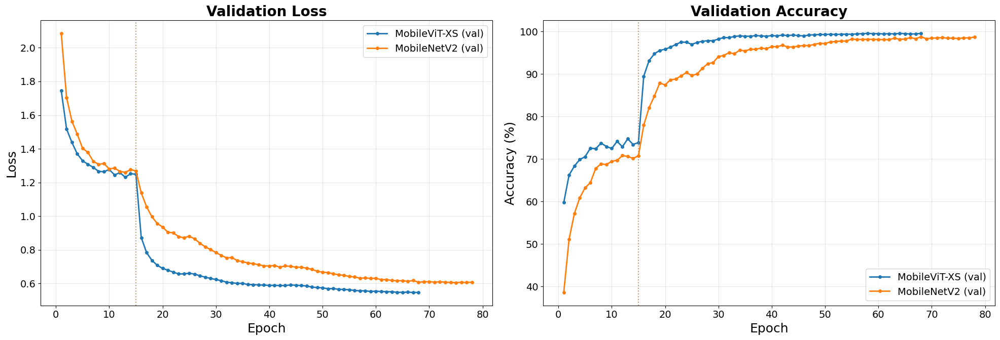

In [31]:
# ── Combined Training Curves (both models overlaid, print-readable) ─────────
fig, ax = plt.subplots(1, 2, figsize=(20, 7))
for key in RESULTS:
    tr = RESULTS[key]["training"]
    combined = tr["phase1_log"] + tr["phase2_log"]
    xs = list(range(1, len(combined) + 1)); p1 = len(tr["phase1_log"])
    vloss = [e["val_loss"] for e in combined]; vacc = [e["val_acc"] * 100 for e in combined]
    lbl = RESULTS[key]["label"]
    line, = ax[0].plot(xs, vloss, "-o", ms=4, linewidth=2, label=f"{lbl} (val)")
    col = line.get_color()
    ax[0].axvline(p1, color=col, ls=":", alpha=0.5)
    ax[1].plot(xs, vacc, "-o", ms=4, linewidth=2, label=f"{lbl} (val)", color=col)
    ax[1].axvline(p1, color=col, ls=":", alpha=0.5)
ax[0].set_title("Validation Loss"); ax[0].set_xlabel("Epoch"); ax[0].set_ylabel("Loss")
ax[0].legend(); ax[0].grid(alpha=0.3)
ax[1].set_title("Validation Accuracy"); ax[1].set_xlabel("Epoch"); ax[1].set_ylabel("Accuracy (%)")
ax[1].legend(); ax[1].grid(alpha=0.3)
plt.tight_layout(); plt.savefig(OUTPUT_DIR / "combined_training_curves.png", dpi=150, bbox_inches="tight"); plt.show()


In [32]:
# ── Combined metrics table (accuracy / precision / recall / F1 per test set) ──
import pandas as pd
rows = []
for key, R in RESULTS.items():
    for split_name in ["synthetic", "fluorescent", "natural"]:
        e = R["eval"][split_name]
        rows.append({
            "Model": R["label"], "Test Set": split_name.capitalize(),
            "Accuracy (%)": round(e["accuracy"]*100, 2),
            "Precision (%)": round(e["precision"]*100, 2),
            "Recall (%)": round(e["recall"]*100, 2),
            "F1 (%)": round(e["f1"]*100, 2),
            "Latency (ms)": round(e.get("avg_inf_ms", 0.0), 2),
        })
metrics_df = pd.DataFrame(rows)
metrics_df.to_csv(OUTPUT_DIR / "model_comparison_metrics.csv", index=False)
print("Saved -> model_comparison_metrics.csv\n")
display(metrics_df)


Saved -> model_comparison_metrics.csv



,Model,Test Set,Accuracy (%),Precision (%),Recall (%),F1 (%),Latency (ms)
0,MobileViT-XS,Synthetic,99.53,99.54,99.53,99.53,16.81
1,MobileViT-XS,Fluorescent,96.00,96.43,96.00,96.00,18.44
2,MobileViT-XS,Natural,86.00,89.63,86.00,85.96,18.81
3,MobileNetV2,Synthetic,98.33,98.35,98.33,98.33,8.55
4,MobileNetV2,Fluorescent,93.33,94.27,93.33,93.37,10.80
5,MobileNetV2,Natural,61.33,74.49,61.33,60.14,10.38


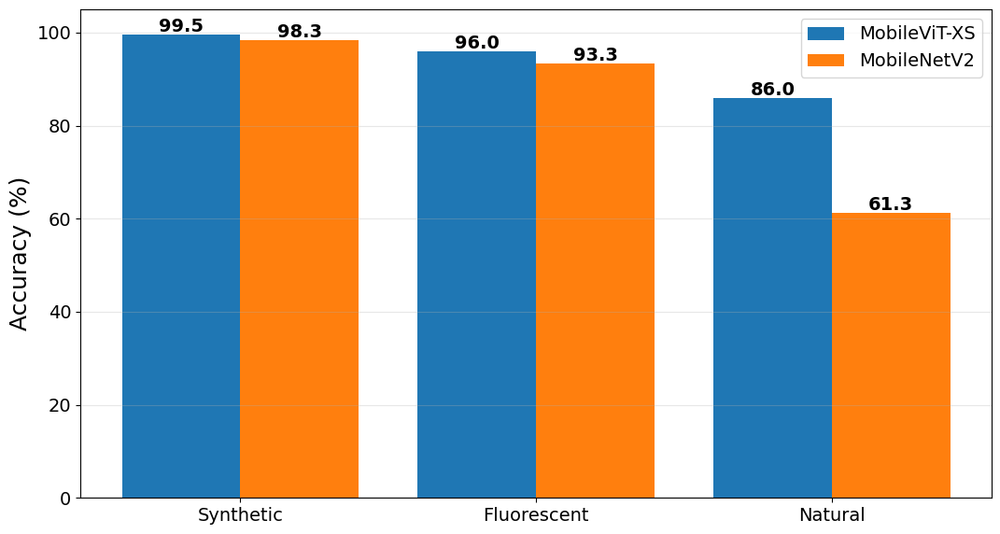

In [33]:
# ── Grouped accuracy bar chart across the three test sets ─────────────────
splits = ["synthetic", "fluorescent", "natural"]
labels = [RESULTS[k]["label"] for k in RESULTS]
x = np.arange(len(splits)); width = 0.8 / max(len(RESULTS), 1)
fig, ax = plt.subplots(figsize=(11, 6))
for i, key in enumerate(RESULTS):
    accs = [RESULTS[key]["eval"][s]["accuracy"]*100 for s in splits]
    bars = ax.bar(x + i*width, accs, width, label=RESULTS[key]["label"])
    for b, a in zip(bars, accs):
        ax.text(b.get_x()+b.get_width()/2, a+0.6, f"{a:.1f}", ha="center", fontsize=14, fontweight="bold")
ax.set_xticks(x + width*(len(RESULTS)-1)/2)
ax.set_xticklabels([s.capitalize() for s in splits])
ax.set_ylabel("Accuracy (%)"); ax.set_ylim(0, 105)
ax.legend(); ax.grid(True, axis="y", alpha=0.3)
plt.tight_layout(); plt.savefig(OUTPUT_DIR / "model_comparison_accuracy.png", dpi=150); plt.show()


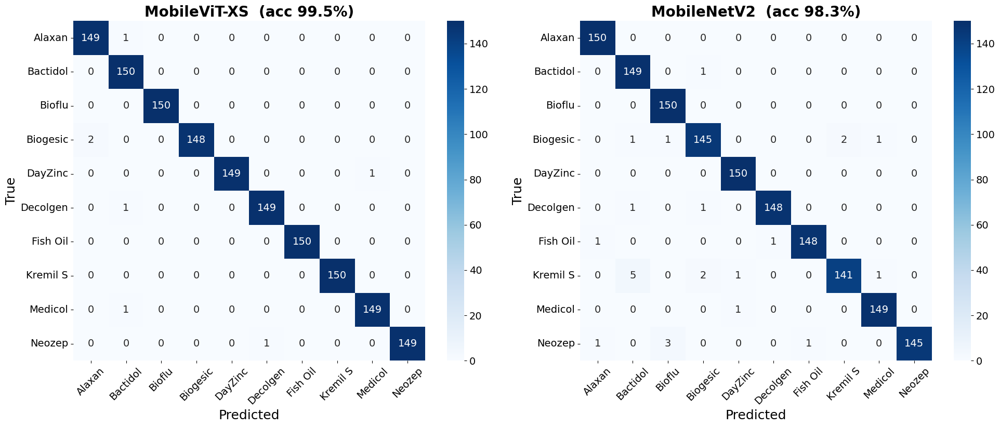

Saved confusion_synthetic.png  (both models, synthetic test set)


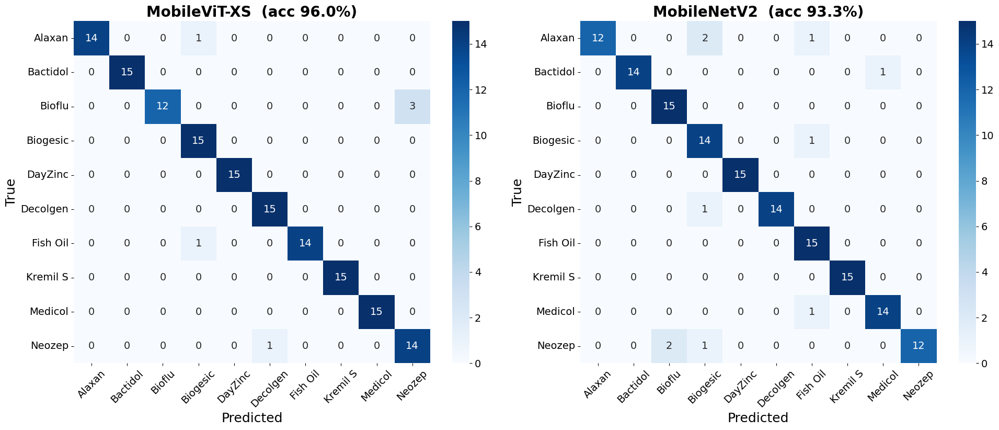

Saved confusion_fluorescent.png  (both models, fluorescent test set)


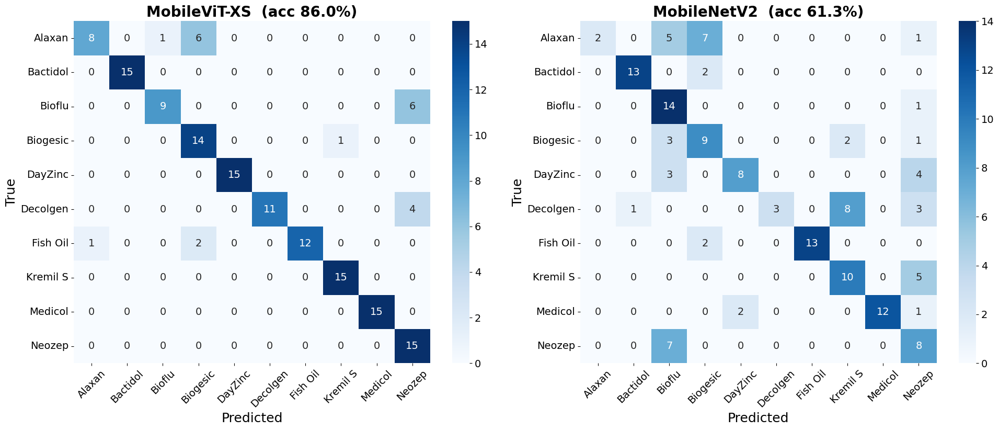

Saved confusion_natural.png  (both models, natural test set)


In [34]:
# ── Confusion Matrices: one figure PER test set, both models side-by-side ───
# Produces three figures (synthetic, fluorescent, natural). Each figure places
# MobileViT-XS and MobileNetV2 side-by-side for direct comparison. No figure-level
# title is drawn inside the image (titles/captions are added in the thesis document);
# each panel is labelled only with its model name and accuracy.
from sklearn.metrics import confusion_matrix

_cm_files = {'synthetic': 'confusion_synthetic.png',
             'fluorescent': 'confusion_fluorescent.png',
             'natural': 'confusion_natural.png'}
keys = list(RESULTS.keys())

for skey in ['synthetic', 'fluorescent', 'natural']:
    fig, axes = plt.subplots(1, len(keys), figsize=(10 * len(keys), 8.5))
    axes = np.atleast_1d(axes).ravel()
    for c, key in enumerate(keys):
        e = RESULTS[key]['eval'][skey]
        cm = confusion_matrix(e['labels'], e['preds'], labels=list(range(len(CLASS_NAMES))))
        ax = axes[c]
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax,
                    annot_kws={'size': 14}, cbar=True)
        # Panel label only (model + accuracy) — NOT a figure title.
        ax.set_title(f"{RESULTS[key]['label']}  (acc {e['accuracy']*100:.1f}%)",
                     fontsize=20, fontweight='bold')
        ax.set_xlabel('Predicted', fontsize=18); ax.set_ylabel('True', fontsize=18)
        ax.tick_params(axis='x', rotation=45, labelsize=14)
        ax.tick_params(axis='y', rotation=0, labelsize=14)
    # No fig.suptitle on purpose (title/caption added in the document).
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / _cm_files[skey], dpi=150, bbox_inches='tight')
    plt.show()
    print(f'Saved {_cm_files[skey]}  (both models, {skey} test set)')


In [35]:
# ── Per-Class F1 Comparison (both models, each test set) ────────────────────
import pandas as pd
from sklearn.metrics import f1_score
for skey, sname in [("synthetic", "Synthetic"), ("fluorescent", "Fluorescent"), ("natural", "Natural")]:
    data = {}
    for key in RESULTS:
        e = RESULTS[key]["eval"][skey]
        f1s = f1_score(e["labels"], e["preds"], labels=list(range(len(CLASS_NAMES))),
                       average=None, zero_division=0)
        data[RESULTS[key]["label"]] = [round(float(x) * 100, 2) for x in f1s]
    df = pd.DataFrame(data, index=CLASS_NAMES); df.index.name = "Class"
    print("=" * 56); print(f"Per-class F1 (%) — {sname}"); print("=" * 56)
    display(df)


Per-class F1 (%) — Synthetic


,MobileViT-XS,MobileNetV2
Class,,
Alaxan,99.00,99.34
Bactidol,99.01,97.39
Bioflu,100.00,98.68
Biogesic,99.33,96.99
DayZinc,99.67,99.34
Decolgen,99.33,99.00
Fish Oil,100.00,99.00
Kremil S,100.00,96.25
Medicol,99.33,99.00


Per-class F1 (%) — Fluorescent


,MobileViT-XS,MobileNetV2
Class,,
Alaxan,96.55,88.89
Bactidol,100.00,96.55
Bioflu,88.89,93.75
Biogesic,93.75,84.85
DayZinc,100.00,100.00
Decolgen,96.77,96.55
Fish Oil,96.55,90.91
Kremil S,100.00,100.00
Medicol,100.00,93.33


Per-class F1 (%) — Natural


,MobileViT-XS,MobileNetV2
Class,,
Alaxan,66.67,23.53
Bactidol,100.00,89.66
Bioflu,72.00,59.57
Biogesic,75.68,51.43
DayZinc,100.00,64.00
Decolgen,84.62,33.33
Fish Oil,88.89,92.86
Kremil S,96.77,57.14
Medicol,100.00,88.89


In [36]:
# ── Synthetic-to-real domain gap per model ───────────────────────────
print("Synthetic-to-Real Domain Gap (percentage points; synthetic acc minus real acc)")
print("-"*72)
for key, R in RESULTS.items():
    syn = R["eval"]["synthetic"]["accuracy"]*100
    fl  = R["eval"]["fluorescent"]["accuracy"]*100
    na  = R["eval"]["natural"]["accuracy"]*100
    print(f"  {R['label']:>14} | synthetic {syn:6.2f}% | fluorescent gap {syn-fl:6.2f} pp | natural gap {syn-na:6.2f} pp")
print("\nGrad-CAM galleries saved per model (open these side by side):")
for key, R in RESULTS.items():
    print(f"  {R['label']}: {key}_fluorescent_gradcam_misclassified.png , {key}_natural_gradcam_misclassified.png")


Synthetic-to-Real Domain Gap (percentage points; synthetic acc minus real acc)
------------------------------------------------------------------------
    MobileViT-XS | synthetic  99.53% | fluorescent gap   3.53 pp | natural gap  13.53 pp
     MobileNetV2 | synthetic  98.33% | fluorescent gap   5.00 pp | natural gap  37.00 pp

Grad-CAM galleries saved per model (open these side by side):
  MobileViT-XS: mobilevit_xs_fluorescent_gradcam_misclassified.png , mobilevit_xs_natural_gradcam_misclassified.png
  MobileNetV2: mobilenetv2_fluorescent_gradcam_misclassified.png , mobilenetv2_natural_gradcam_misclassified.png


------------------------------------------------------------------------

### Section 6a. Natural-Light Failure Diagnosis (per-class, confusion, worst pairs)

Before attributing natural-light errors to lighting, this cell separates the failure types for **both models**: per-class accuracy, the natural-light confusion matrix, and the most frequent (true → predicted) confusion pairs. The **Alaxan** class is kept in the analysis but flagged, because its training and real-world product appearances differ (the documented Alaxan FR mismatch). Alaxan errors are therefore mismatch-driven, not a lighting failure, and no lighting augmentation can be expected to fix them.

In [37]:
# ── Natural-Light Failure Diagnosis (both models) ──────────────────────
# Reads the per-image predictions already stored in RESULTS[key]["eval"]["natural"].
# Flags Alaxan as a known product-mismatch class (not a lighting failure).
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix

MISMATCH_CLASSES = ["Alaxan"]   # documented Alaxan FR train/test product mismatch

def diagnose_natural(key):
    R = RESULTS[key]; label = R["label"]
    ev = R["eval"]["natural"]
    y_true = np.array(ev["labels"]); y_pred = np.array(ev["preds"])
    n = len(y_true)
    print("#"*72)
    print(f"#  NATURAL-LIGHT DIAGNOSIS — {label}   (n = {n})")
    print("#"*72)

    # --- Per-class accuracy ---
    rows = []
    for idx, cname in enumerate(CLASS_NAMES):
        mask = y_true == idx
        support = int(mask.sum())
        correct = int((y_pred[mask] == idx).sum()) if support else 0
        acc = (correct / support * 100) if support else float("nan")
        rows.append({"Class": cname, "Support": support, "Correct": correct,
                     "Accuracy (%)": round(acc, 1),
                     "Note": "MISMATCH (Alaxan FR)" if cname in MISMATCH_CLASSES else ""})
    per_class = pd.DataFrame(rows)
    print("\nPer-class accuracy:")
    print(per_class.to_string(index=False))

    # --- Overall vs Alaxan-excluded accuracy (isolates the mismatch effect) ---
    overall = (y_pred == y_true).mean() * 100
    mm_idx = [CLASS_NAMES.index(c) for c in MISMATCH_CLASSES if c in CLASS_NAMES]
    keep = ~np.isin(y_true, mm_idx)
    excl = (y_pred[keep] == y_true[keep]).mean() * 100 if keep.any() else float("nan")
    print(f"\nOverall natural-light accuracy            : {overall:.2f}%")
    print(f"Accuracy EXCLUDING mismatch class(es) {MISMATCH_CLASSES}: {excl:.2f}%")
    print(f"  → the difference isolates how much the Alaxan FR mismatch alone costs.")

    # --- Worst confusion pairs (true → predicted), off-diagonal ---
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(CLASS_NAMES))))
    pairs = []
    for i in range(len(CLASS_NAMES)):
        for j in range(len(CLASS_NAMES)):
            if i != j and cm[i, j] > 0:
                pairs.append((CLASS_NAMES[i], CLASS_NAMES[j], int(cm[i, j])))
    pairs.sort(key=lambda t: t[2], reverse=True)
    print("\nWorst confusion pairs (True → Predicted, count):")
    if pairs:
        for t, pr, c in pairs[:8]:
            flag = "  [Alaxan mismatch]" if (t in MISMATCH_CLASSES or pr in MISMATCH_CLASSES) else ""
            print(f"   {t:>10} → {pr:<10} : {c}{flag}")
    else:
        print("   (none — no misclassifications)")
    return per_class, overall, excl, pairs

natural_diag = {}
for key in RESULTS:
    natural_diag[key] = diagnose_natural(key)
    print()

# --- Compact comparison: natural-light accuracy with vs without the mismatch class ---
print("="*72)
print("Summary — natural-light accuracy, full vs Alaxan-excluded")
print("="*72)
for key in RESULTS:
    _, ov, ex, _ = natural_diag[key]
    print(f"  {RESULTS[key]['label']:>14} | full {ov:6.2f}% | excl. Alaxan {ex:6.2f}% | mismatch cost {ov and (ex-ov):+.2f} pp")
print("\nInterpretation: a large positive ‘mismatch cost’ means much of the natural-light")
print("error is the Alaxan FR product mismatch (NOT augmentable); a small one means the")
print("errors are genuinely lighting/colour-driven (augmentation may help).")


########################################################################
#  NATURAL-LIGHT DIAGNOSIS — MobileViT-XS   (n = 150)
########################################################################

Per-class accuracy:
   Class  Support  Correct  Accuracy (%)                 Note
  Alaxan       15        8          53.3 MISMATCH (Alaxan FR)
Bactidol       15       15         100.0                     
  Bioflu       15        9          60.0                     
Biogesic       15       14          93.3                     
 DayZinc       15       15         100.0                     
Decolgen       15       11          73.3                     
Fish Oil       15       12          80.0                     
Kremil S       15       15         100.0                     
 Medicol       15       15         100.0                     
  Neozep       15       15         100.0                     

Overall natural-light accuracy            : 86.00%
Accuracy EXCLUDING mismatch class(es) ['Alaxa

------------------------------------------------------------------------

### Section 6b. Grad-CAM on Misclassified Real-World Images (both models)

Run after both models are trained. Each model is reloaded from its best checkpoint and its misclassified real-world images are shown as Grad-CAM heatmaps for both lighting conditions, so the two models' failure patterns can be compared.

[MobileViT-XS] total params: 1,936,698 | trainable: 1,936,698 | frozen: 0
######################################################################
#  GRAD-CAM (misclassified) — MobileViT-XS
######################################################################
Fluorescent Light: 6 misclassified image(s).


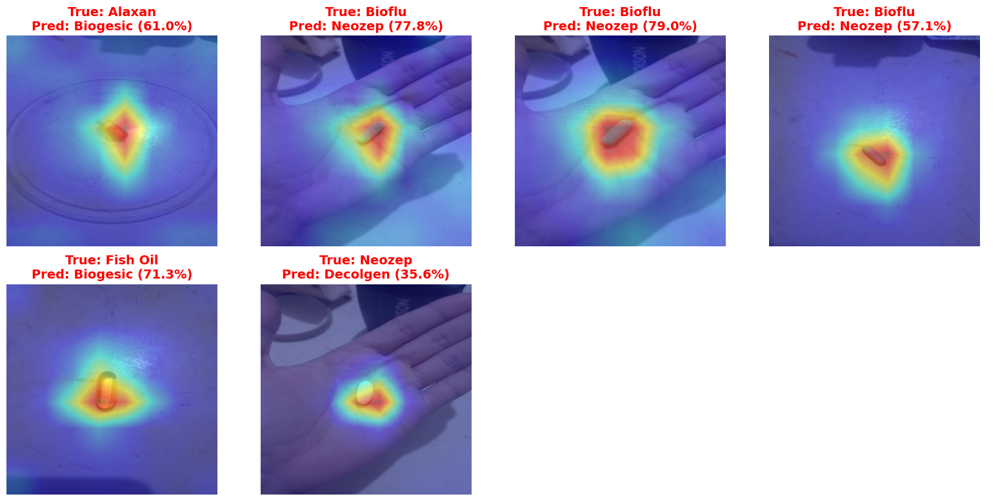

Natural Light: 21 misclassified image(s).


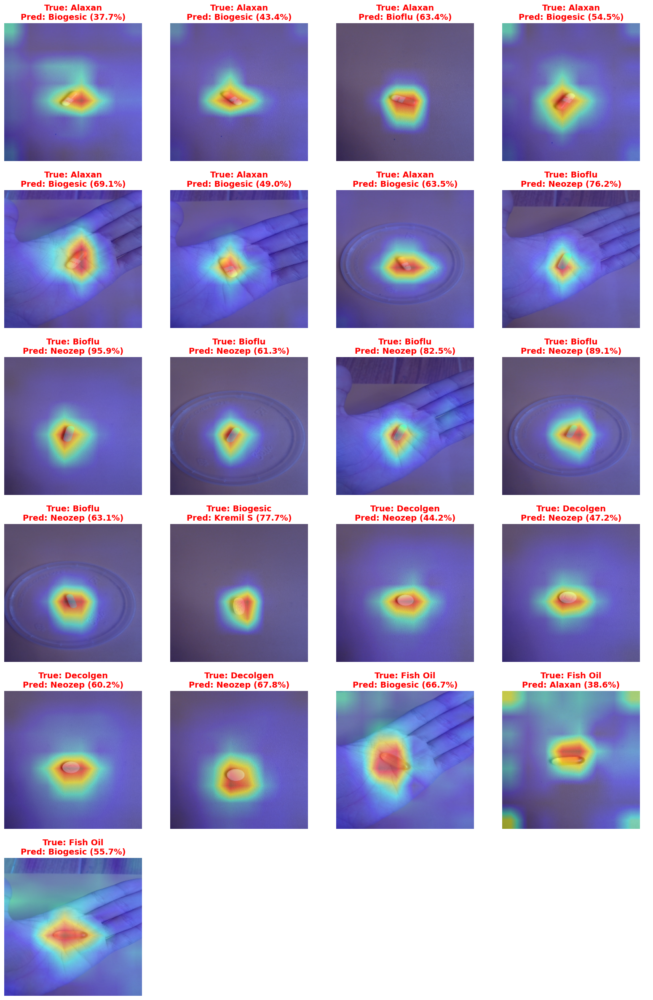

[MobileViT-XS] misclassified — fluorescent: 6 | natural: 21
[MobileNetV2] total params: 2,236,682 | trainable: 2,236,682 | frozen: 0
######################################################################
#  GRAD-CAM (misclassified) — MobileNetV2
######################################################################
Fluorescent Light: 10 misclassified image(s).


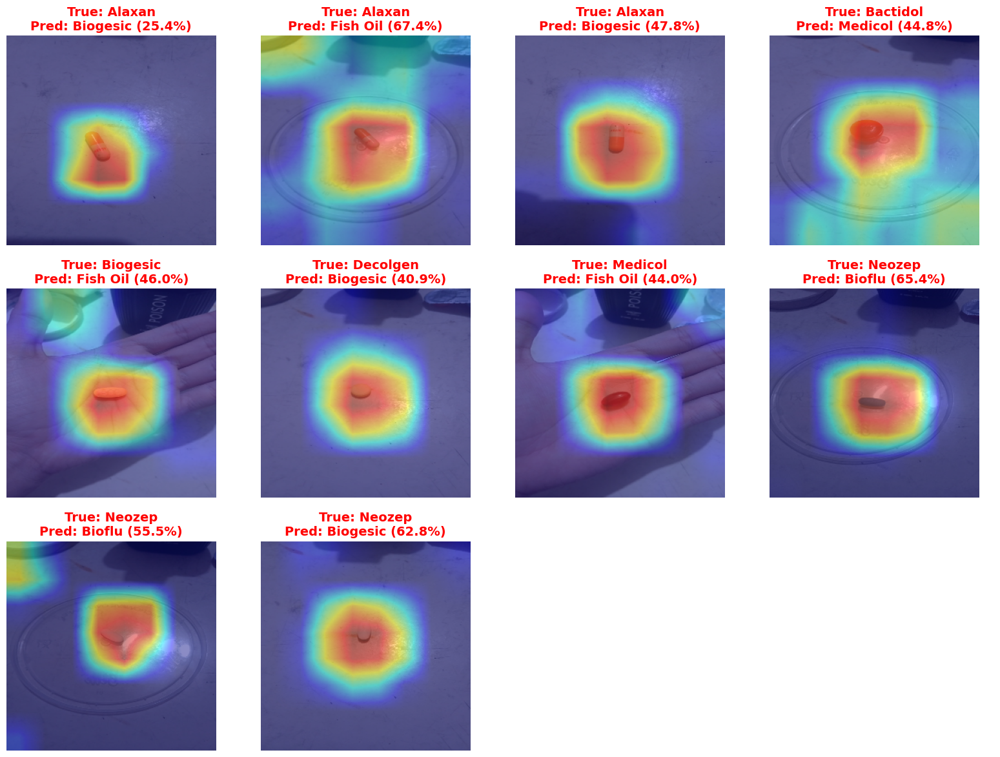

Natural Light: 58 misclassified image(s).


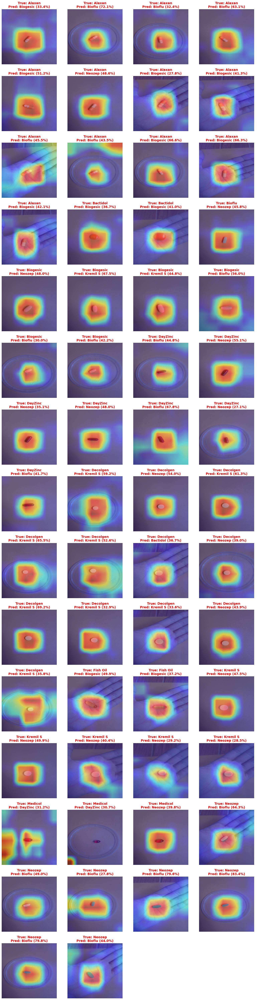

[MobileNetV2] misclassified — fluorescent: 10 | natural: 58


In [38]:
# ── Grad-CAM galleries for both models (misclassified real-world images) ────
for spec in MODEL_SPECS:
    key = spec["key"]
    model = build_model(spec, pretrained=False, freeze_backbone=False).to(CFG["device"])
    ckpt = torch.load(spec_paths(spec)["best_ckpt"], map_location=CFG["device"])
    model.load_state_dict(ckpt["model_state"]); model.eval()
    cam = run_gradcam(spec, model)
    RESULTS[key]["gradcam_counts"] = {k: len(v) for k, v in cam.items()}
    del model; torch.cuda.empty_cache()


------------------------------------------------------------------------

## Section 8. Comprehensive Results Export (single JSON)

Consolidates every result the thesis needs into one file, `thesis_results.json`: full training history (Phase 1 + Phase 2) per model; synthetic, fluorescent, and natural accuracy with weighted precision/recall/F1; per-class classification reports and confusion matrices for all three test sets; the combined real-world (300-image) metrics; the **per-image predictions for the 300 real-world images** (filename, true class, predicted class, confidence, full softmax) — the synthetic per-image predictions are excluded as requested, though synthetic accuracy and its report/matrix are kept; the Alaxan-mismatch breakdown for natural light; Grad-CAM misclassification counts; and the export (ONNX/TFLite) sizes. All values are taken from the results already computed above, so the JSON matches the figures exactly.

In [39]:
# ── Build one comprehensive results JSON for the thesis ───────────────────
import json as _json, datetime, numpy as np
from pathlib import Path
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_fscore_support

MISMATCH_CLASSES = ["Alaxan"]   # documented Alaxan FR train/test product mismatch

def _native(o):
    if isinstance(o, dict):  return {k: _native(v) for k, v in o.items()}
    if isinstance(o, (list, tuple)): return [_native(v) for v in o]
    if isinstance(o, np.integer):  return int(o)
    if isinstance(o, np.floating): return float(o)
    if isinstance(o, np.ndarray):  return o.tolist()
    return o

def _ordered_real_files(test_dir):
    """Replicate evaluate_dataset() iteration EXACTLY so filenames align to stored preds."""
    test_dir = Path(test_dir); files = []
    for cls_name in sorted(CLASS_NAMES):
        cls_path = test_dir / cls_name
        if not cls_path.exists():
            continue
        for img_path in list(cls_path.glob("*.jpg")) + list(cls_path.glob("*.png")):
            if cv2.imread(str(img_path)) is None:   # mirror eval skip of unreadable files
                continue
            files.append((cls_name, img_path.name))
    return files

def _report_and_cm(labels, preds):
    rep = classification_report(labels, preds, labels=list(range(len(CLASS_NAMES))),
                                target_names=CLASS_NAMES, output_dict=True, zero_division=0)
    cm = confusion_matrix(labels, preds, labels=list(range(len(CLASS_NAMES)))).tolist()
    return rep, cm

def _split_metrics(labels, preds):
    acc = accuracy_score(labels, preds)
    pr, rc, f1, _ = precision_recall_fscore_support(labels, preds, average="weighted", zero_division=0)
    rep, cm = _report_and_cm(labels, preds)
    return {"accuracy": float(acc), "precision_weighted": float(pr),
            "recall_weighted": float(rc), "f1_weighted": float(f1),
            "classification_report": rep, "confusion_matrix": cm}

def _per_image_real(spec_key):
    """Per-image records for the 300 real-world images (fluorescent + natural)."""
    ev = RESULTS[spec_key]["eval"]; records = []
    for cond, test_dir in [("fluorescent", FLUOR_TEST_DIR), ("natural", NATURAL_TEST_DIR)]:
        e = ev[cond]
        files = _ordered_real_files(test_dir)
        preds, labels, probs = e["preds"], e["labels"], e["probs"]
        has_names = (len(files) == len(preds))
        for i in range(len(preds)):
            fname = files[i][1] if has_names else None
            rec = {"condition": cond,
                   "filename": fname,
                   "index": i,
                   "true_class": CLASS_NAMES[labels[i]],
                   "predicted_class": CLASS_NAMES[preds[i]],
                   "confidence_pct": round(float(np.max(probs[i])) * 100, 2),
                   "correct": bool(preds[i] == labels[i]),
                   "is_mismatch_class": CLASS_NAMES[labels[i]] in MISMATCH_CLASSES,
                   "softmax": [round(float(x), 5) for x in probs[i]]}
            records.append(rec)
        if not has_names:
            print(f"  WARNING [{spec_key}/{cond}]: filename count {len(files)} != preds {len(preds)}; "
                  f"filenames set to null (order preserved).")
    return records

def _natural_mismatch_breakdown(spec_key):
    e = RESULTS[spec_key]["eval"]["natural"]
    y_true = np.array(e["labels"]); y_pred = np.array(e["preds"])
    mm = [CLASS_NAMES.index(c) for c in MISMATCH_CLASSES if c in CLASS_NAMES]
    keep = ~np.isin(y_true, mm)
    overall = float((y_pred == y_true).mean()) if len(y_true) else float("nan")
    excl = float((y_pred[keep] == y_true[keep]).mean()) if keep.any() else float("nan")
    per_class = {}
    for idx, cname in enumerate(CLASS_NAMES):
        m = y_true == idx; sup = int(m.sum())
        per_class[cname] = {"support": sup,
                            "correct": int((y_pred[m] == idx).sum()) if sup else 0,
                            "accuracy": float((y_pred[m] == idx).mean()) if sup else None,
                            "is_mismatch_class": cname in MISMATCH_CLASSES}
    return {"accuracy_all": overall, "accuracy_excluding_mismatch": excl,
            "mismatch_cost_pp": float((excl - overall) * 100) if not np.isnan(excl) else None,
            "mismatch_classes": MISMATCH_CLASSES, "per_class_accuracy": per_class}

# ---- Assemble ----
report = {
    "metadata": {
        "generated_at": datetime.datetime.now().isoformat(timespec="seconds"),
        "seed": SEED,
        "class_names": CLASS_NAMES,
        "num_classes": CFG["num_classes"],
        "img_size": CFG["img_size"],
        "split_sizes": {"train": len(train_paths), "val": len(val_paths),
                         "synthetic_test": len(synth_test_paths)},
        "real_world_test": {"fluorescent": 150, "natural": 150, "total": 300,
                             "per_class": 15},
        "training_config": {"phase1_epochs": PHASE1_EPOCHS, "phase1_lr": PHASE1_LR,
                             "phase2_max_epochs": CFG["epochs"], "phase2_lr": PHASE2_LR,
                             "weight_decay": CFG["weight_decay"], "label_smoothing": CFG["label_smooth"],
                             "batch_size": CFG["batch_size"], "patience": CFG["patience"],
                             "optimizer": "AdamW"},
        "augmentation": "training-split only; see TRAIN_AUGMENT cell for exact ops",
        "dataset_provenance": "synthetic composites: DSLR pill foregrounds (alpha PNG via GIMP) "
                              "scattered over Pexels backgrounds; license CC BY-SA 3.0 (vencerlanz09)",
        "known_limitations": {"alaxan_fr_mismatch": "Alaxan train vs real-world product appearance differs; "
                              "its real-world errors are mismatch-driven, not lighting-driven."},
        "notes": "Synthetic per-image predictions intentionally excluded; synthetic accuracy, "
                 "classification report and confusion matrix are included.",
    },
    "models": {},
}

for key in RESULTS:
    R = RESULTS[key]; ev = R["eval"]
    # combined real-world (300) metrics from concatenated stored preds
    rw_labels = ev["fluorescent"]["labels"] + ev["natural"]["labels"]
    rw_preds  = ev["fluorescent"]["preds"]  + ev["natural"]["preds"]
    model_block = {
        "label": R["label"],
        "training": {
            "phase1_history": R["training"]["phase1_log"],
            "phase2_history": R["training"]["phase2_log"],
            "best_val_accuracy": R["training"]["best_val_acc"],
            "phase2_epochs_run": R["training"]["phase2_epochs_run"],
            "total_epochs": len(R["training"]["phase1_log"]) + len(R["training"]["phase2_log"]),
        },
        "metrics": {
            "synthetic":   _split_metrics(ev["synthetic"]["labels"], ev["synthetic"]["preds"]),
            "fluorescent": _split_metrics(ev["fluorescent"]["labels"], ev["fluorescent"]["preds"]),
            "natural":     _split_metrics(ev["natural"]["labels"], ev["natural"]["preds"]),
            "real_world_combined": _split_metrics(rw_labels, rw_preds),
        },
        "mean_inference_ms": {
            "synthetic": ev["synthetic"].get("avg_inf_ms"),
            "fluorescent": ev["fluorescent"].get("avg_inf_ms"),
            "natural": ev["natural"].get("avg_inf_ms"),
        },
        "natural_light_diagnosis": _natural_mismatch_breakdown(key),
        "gradcam_misclassified_counts": R.get("gradcam_counts", {}),
        "export": R.get("export", {}),
        "real_world_predictions": _per_image_real(key),
    }
    report["models"][key] = model_block

# Cross-model comparison block
report["comparison"] = {
    "accuracy_by_test_set": {
        key: {s: RESULTS[key]["eval"][s]["accuracy"] for s in ["synthetic", "fluorescent", "natural"]}
        for key in RESULTS},
    "synthetic_to_real_gap_pp": {
        key: {"fluorescent": (RESULTS[key]["eval"]["synthetic"]["accuracy"]
                              - RESULTS[key]["eval"]["fluorescent"]["accuracy"]) * 100,
              "natural": (RESULTS[key]["eval"]["synthetic"]["accuracy"]
                          - RESULTS[key]["eval"]["natural"]["accuracy"]) * 100}
        for key in RESULTS},
}

json_path = OUTPUT_DIR / "thesis_results.json"
with open(json_path, "w") as f:
    _json.dump(_native(report), f, indent=2)

size_kb = json_path.stat().st_size / 1024
n_preds = sum(len(report["models"][k]["real_world_predictions"]) for k in report["models"])
print(f"Wrote {json_path}  ({size_kb:.1f} KB)")
print(f"Models: {list(report['models'].keys())}")
print(f"Real-world per-image predictions stored: {n_preds} (expected 600 = 2 models x 300)")
for key in report["models"]:
    m = report["models"][key]
    syn = m["metrics"]["synthetic"]["accuracy"]*100
    fl  = m["metrics"]["fluorescent"]["accuracy"]*100
    na  = m["metrics"]["natural"]["accuracy"]*100
    print(f"  {m['label']:>14} | synth {syn:5.2f}% | fluor {fl:5.2f}% | natural {na:5.2f}%")


Wrote /kaggle/working/medisina_output/thesis_results.json  (400.0 KB)
Models: ['mobilevit_xs', 'mobilenetv2']
Real-world per-image predictions stored: 600 (expected 600 = 2 models x 300)
    MobileViT-XS | synth 99.53% | fluor 96.00% | natural 86.00%
     MobileNetV2 | synth 98.33% | fluor 93.33% | natural 61.33%


------------------------------------------------------------------------

## Section 7. App Artifacts and Output Management

In [40]:
# ── Write labels.txt (index -> class name) for the Flutter app & reproducibility ──
labels_path = OUTPUT_DIR / 'labels.txt'
with open(labels_path, 'w') as f:
    for name in CLASS_NAMES:
        f.write(name + '\n')
print('labels.txt written:', labels_path)
for i, name in enumerate(CLASS_NAMES):
    print(f'  {i}: {name}')

labels.txt written: /kaggle/working/medisina_output/labels.txt
  0: Alaxan
  1: Bactidol
  2: Bioflu
  3: Biogesic
  4: DayZinc
  5: Decolgen
  6: Fish Oil
  7: Kremil S
  8: Medicol
  9: Neozep


In [41]:
# ── Output Directory Inspection ────────────────────────────────────────
# Lists all files produced during this experiment session with their
# sizes and a summary of the persisted session state.
print("Files in output directory:")
total_bytes = 0
for p in sorted(OUTPUT_DIR.rglob("*")):
    if p.is_file():
        sz = p.stat().st_size
        total_bytes += sz
        unit = "MB" if sz > 1_048_576 else "KB"
        val  = sz / 1_048_576 if sz > 1_048_576 else sz / 1024
        print(f"  {str(p.relative_to(OUTPUT_DIR)):<52}  {val:6.1f} {unit}")
print(f"\n  Total: {total_bytes/1e6:.2f} MB")

print("\nSession state:")
state = load_session_state()
for k, v in state.items():
    print(f"  {k:<24}: {v}")

Files in output directory:
  augmentation_preview.png                                 1.3 MB
  best_mobilenetv2.pth                                     8.8 MB
  best_mobilevit_xs.pth                                    7.5 MB
  class_distribution.png                                 100.3 KB
  combined_training_curves.png                           173.7 KB
  confusion_fluorescent.png                              150.3 KB
  confusion_natural.png                                  163.0 KB
  confusion_synthetic.png                                167.4 KB
  labels.txt                                               0.1 KB
  mobilenetv2.onnx                                         8.5 MB
  mobilenetv2.tflite                                       8.5 MB
  mobilenetv2_fluorescent_gradcam_misclassified.png        1.9 MB
  mobilenetv2_natural_gradcam_misclassified.png           11.4 MB
  mobilenetv2_tf/mobilenetv2_float16.tflite                4.3 MB
  mobilenetv2_tf/mobilenetv2_float32.tflite      

### Section 7a. Push Outputs to Kaggle Dataset

In [42]:
# =====================================================================
# Push Output Directory to Kaggle Dataset
# Execute this cell before closing the session to back up all
# checkpoints and outputs to a persistent private Kaggle dataset.
# =====================================================================
# Set your Kaggle dataset slug:
KAGGLE_DATASET_SLUG = None   # e.g.  "your-username/medisina-output"

backup_to_kaggle_dataset(KAGGLE_DATASET_SLUG)

KAGGLE_DATASET_SLUG is not set. Skipping backup.
Set it to e.g. "your-username/medisina-output" and re-run.


### Section 7b. Restore from Kaggle Dataset (New Session)

When starting a new Kaggle session, attach your backup dataset via *Add
Data* in the right sidebar, set the `RESTORE_FROM` variable below, and
execute this cell to restore all checkpoints and logs.

In [43]:
# ── Restore Output Directory from Kaggle Dataset Backup ────────────────
# After attaching the backup dataset via the Kaggle UI (Add Data),
# it becomes accessible at /kaggle/input/<dataset-slug>/.
# This cell copies all files from the backup into OUTPUT_DIR and
# prompts re-execution of the Session Recovery Manager cell.

RESTORE_FROM = None  # e.g. Path("/kaggle/input/medisina-output/medisina_output")

if RESTORE_FROM and Path(RESTORE_FROM).exists():
    src = Path(RESTORE_FROM)
    print(f"Restoring from {src} ...")
    restored = 0
    for file in src.rglob("*"):
        if file.is_file():
            dest = OUTPUT_DIR / file.relative_to(src)
            dest.parent.mkdir(parents=True, exist_ok=True)
            shutil.copy2(str(file), str(dest))
            print(f"  {dest.relative_to(OUTPUT_DIR)}")
            restored += 1
    print(f"\nRestored {restored} files to {OUTPUT_DIR}")
    print("Re-run the Session Recovery Manager cell to load state.")
else:
    print("RESTORE_FROM is not set or the path does not exist.")
    print("Steps:")
    print("  1. Add your backup dataset via Kaggle UI (Add Data)")
    print("  2. Set RESTORE_FROM to the /kaggle/input/... path")
    print("  3. Re-run this cell")

RESTORE_FROM is not set or the path does not exist.
Steps:
  1. Add your backup dataset via Kaggle UI (Add Data)
  2. Set RESTORE_FROM to the /kaggle/input/... path
  3. Re-run this cell
